# 03 - Labeling Example Figures

## Imports

In [1]:
import numpy as np
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import avn.dataloading
import avn.plotting
import hdbscan
import math
import sklearn
import seaborn as sns
import umap
import os
import glob
from random import sample

c:\Users\tkoch\anaconda3\envs\avn_UMAP\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def make_spec(syll_wav, hop_length, win_length, n_fft, amin, ref_db, min_level_db):
    spectrogram = librosa.stft(syll_wav, hop_length = hop_length, win_length = win_length, n_fft = n_fft)
    spectrogram_db = librosa.amplitude_to_db(np.abs(spectrogram), amin = amin, ref = ref_db)
    
    #normalize
    S_norm = np.clip((spectrogram_db - min_level_db) / -min_level_db, 0, 1)
    
    return S_norm

In [3]:
def clean_syll_table(syll_table): 
  '''
  Reformats syll tables imported from evsonganaly so that they are compatible
  with python generated ones

  Inputs
  ----
  syll_table: Pandas Dataframe, imported from a csv containing evsonganaly 
  segmentation and labeling info

  Outputs
  ----
  syll_table: Pandas Dataframe, now with corrected file names and timestamps in seconds

  Notes
  -----
  This function specifically removes .not.mat file extensions from the file names
  so that they are simply .wav and can be compared to file names in the MFCC
  segmentation generated syllable tables. It also converts the timestamps of 
  onsets and offsets from miliseconds to seconds, again so that it is consistent
  with the MFCC resuls
  ''' 

  syll_table['onsets'] = syll_table['onsets'] / 1000
  syll_table['offsets'] = syll_table['offsets'] / 1000

  syll_table['files'] = syll_table['files'].str.split(pat = '.not', n = 1).str[0]

  return syll_table

In [4]:
def plot_confusion_matrix(all_matches):
  temp_df = pd.DataFrame({"hand_labels": all_matches.hand_label, 
                          "clusters": all_matches.hdbscan_labels})
  conf_mat = pd.crosstab(temp_df.hand_labels, temp_df.clusters)
  conf_mat = conf_mat.div(conf_mat.sum(axis = 1), axis = 0) * 100

  plt.figure(figsize = (4,3))
  sns.heatmap(conf_mat, annot = True, fmt='.0f')

In [5]:
def merge_hdbscan_hand_dfs(hdbscan_df, hand_df):
  
  all_matches = pd.DataFrame()

  for song_file in hdbscan_df.files.unique():
    hdbscan_file = hdbscan_df[hdbscan_df.files == song_file]
    hdbscan_file = hdbscan_file.reset_index(drop = True)
    hand_file = hand_df[hand_df.files == song_file]

    if hand_file.shape[0] != 0:
      hand_onsets = hand_file.onsets
      hdbscan_onsets = hdbscan_file.onsets
      best_matches = get_best_matches(hand_onsets, hdbscan_onsets, max_gap = 0.1)
      matches_file = pd.DataFrame({"files" : song_file,
                                 "best_match" : best_matches.astype(int), 
                                 "hand_onset" : hand_file.onsets, 
                                 "hand_offset" : hand_file.offsets, 
                                 "hand_label" : hand_file.labels})
      matches_file = matches_file.merge(right = hdbscan_file, 
                                        left_on = 'best_match', 
                                        how = 'outer', 
                                        right_index = True)
    all_matches = pd.concat([all_matches, matches_file])

  return all_matches


In [6]:
def get_best_matches(first_onsets, second_onsets, max_gap = 0.1):
  '''
  Finds the best unique matches between timestamps in two sets, calcuated in different
  ways on the same file. These can reflect syllable onset or offset timestamps, 
  although I refer to them only as onsets for simplicity. 

  Inputs
  ------
  first_onsets: Pandas Series, Contains the timestamps in seconds of syllable onsets
  calculated with a particular method. 

  second_onsets: Pandas Seris, Contains the timestamps in seconds of syllable onsets
  calculated with a different method. 

  max_gap: int > 0, optional, maximum allowable time difference  in seconds 
  between onsets where they will still be considered a match.

  Outputs
  -------
  best_matches: numpy array, 1D, For every syllable onset in `first_onsets` it 
  contains the index of the best unique match in `second_onsets`. If there is 
  no unique match within the allowable `max_gap`, the value of the match is 
  `NaN`. 
  '''
  first_grid, second_grid = np.meshgrid(first_onsets, second_onsets)
  delta_t_grid = abs(first_grid - second_grid)

  #set max gap threshold
  delta_t_grid = np.where(delta_t_grid > max_gap, np.inf, delta_t_grid)

  if delta_t_grid.shape[0] == 0:
    best_matches = np.array([])
    return best_matches ############################################################################test

  #find best matches
  best_matches = np.argmin(delta_t_grid, axis = 0).astype(float)

  #remove matches were delta t is > max_gap
  for i, match_index in enumerate(best_matches):
    if np.isinf(delta_t_grid[int(match_index), i]):
      best_matches[i] = np.NaN 

  best_matches_previous = best_matches.copy()   

  #Deal with duplicate values by setting the second best matches to their second best pairs
  best_matches, delta_t_grid = correct_duplicates(best_matches, delta_t_grid)

  #check if there were changes made by checking for duplicates. If so, repeat duplicate check.
  if not np.allclose(best_matches, best_matches_previous):
    best_matches, delta_t_grid = correct_duplicates(best_matches, delta_t_grid)

  #make sure duplicate corrections didn't result in out of order matches. 
  for i, curr_match in enumerate(best_matches):
     if i+1 < len(best_matches):
       if curr_match > best_matches[i+1]:
         best_matches[i+1] = np.nan

  return best_matches

In [7]:
def vak_to_syll_table(prediction_results):
  prediction_syllables = prediction_results[prediction_results['label'] == "s"]
  prediction_syll_reformat = pd.DataFrame()
  prediction_syll_reformat["files"] = prediction_syllables['audio_file']
  prediction_syll_reformat['onsets'] = prediction_syllables['onset_s']
  prediction_syll_reformat['offsets'] = prediction_syllables['offset_s']

  return prediction_syll_reformat

In [8]:
def correct_duplicates(best_matches, delta_t_grid):
  '''
  Finds any duplicate matches in the set of best matches, removes duplicates
  by setting all but best match to their second best match. 

  Inputs
  -----
  best_matches: numpy array, 1D, contains indices of onsets in one set which best 
  match the onsets in another set. 

  delta_t_grid: numpy array, 2D, contains all the absolute value time differences
  between all possible pairs of onsets in two sets being compared.

  Outputs
  -----
  best_matches: numpy array, 1D. Same as input, but with duplicate matches corrected

  delta_t_grid: numpy array, 2D. Same as input, but with values at duplicated 
  positions adjusted to allow finding second best match. 


  '''
  for i, match_index in enumerate(best_matches):
    if np.isnan(match_index):
      continue
    #check if match index is duplicated
    if len(np.argwhere(best_matches == match_index)) > 1: 
      #create list of indices of duplicates
      duplicates = np.nonzero(best_matches == match_index)[0]
      #find which duplicate has the smallest delta t
      delta_ts = []
      for n in duplicates:
        delta_ts.append(delta_t_grid[int(best_matches[n]), n])

      #get all but the best matches of the duplicates
      bad_matches = np.delete(duplicates, np.argmin(delta_ts))

      #find second best matches for all but the best duplicate matches

      for bad_match in bad_matches:
        delta_t_grid[int(best_matches[bad_match]), bad_match] = np.inf
        best_matches[bad_match] = np.argmin(delta_t_grid[:, bad_match])
        if np.isinf(np.min(delta_t_grid[:, bad_match])):
          best_matches[bad_match] = np.NaN
  return (best_matches, delta_t_grid)

In [9]:
def remove_nas_from_merge(all_matches, fill_char = 'x', fill_int = 1000):
  
  all_matches.hand_label = all_matches.hand_label.fillna(fill_char)
  all_matches.hdbscan_labels = all_matches.hdbscan_labels.fillna(fill_int)

  return all_matches

## Get List of Birds

In [10]:
All_Birds = ["B145", "B236", "B258", "B385", "B402", "B447", 
             "B507", "G255", "G397", "G402", "G413", "G437", 
             "G439", "G524", "G528", "O144", "O254", "O421", 
             "O440", "O512", "R402", "R425", "R469", "S132", 
             "S421", "S525", "S528", "Y389", "Y397", "Y425", 
             "Y440", "B524", "O434", "S389", "Y433", "Y453"] 

#All_Birds should contain 36 bird IDs. Check: 
len(All_Birds)

36

## WSEG - UMAP Plot All

In [14]:
import warnings
warnings.filterwarnings("ignore")

In [15]:
amin = 1e-5
ref_db = 20
min_level_db = -28
win_length = 512 #the AVGN default is based on ms duration and sample rate, and it 441. 
hop_length = 128 #the AVGN default is based on ms duration and sample rate, and it is 88. 
n_fft = 512
K = 10
min_cluster_prop = 0.04
embedding_dim = 2

In [16]:
np.random.seed(42)

B145


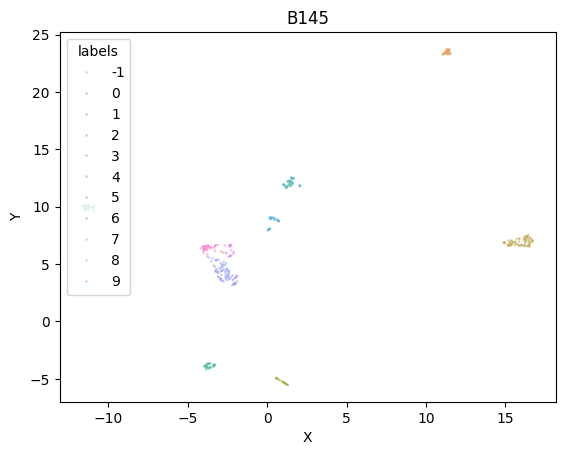

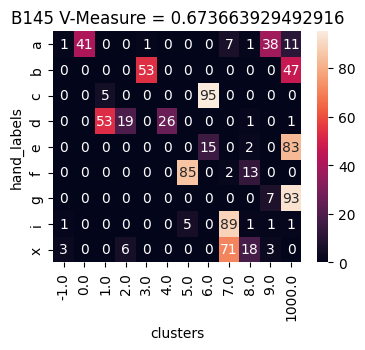

B236


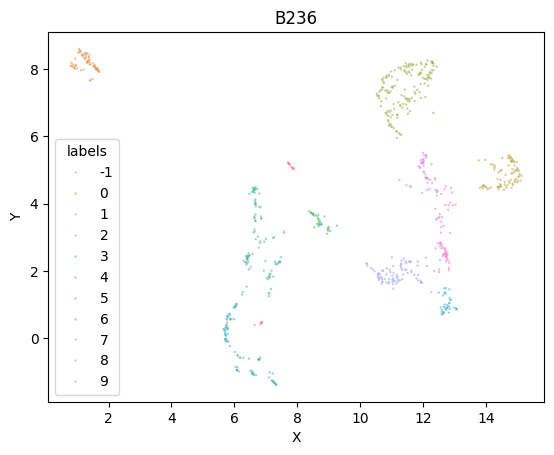

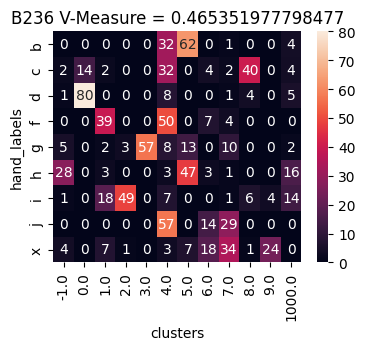

B258


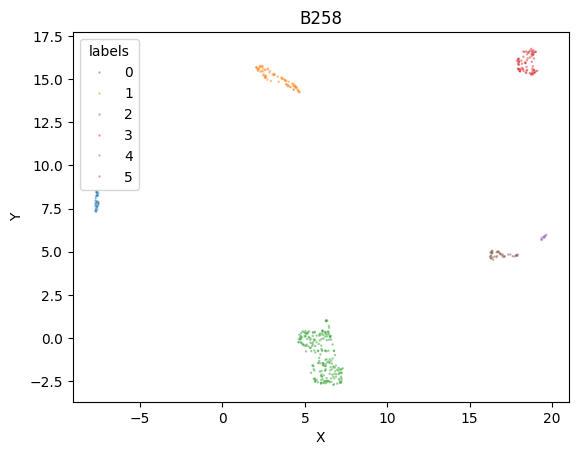

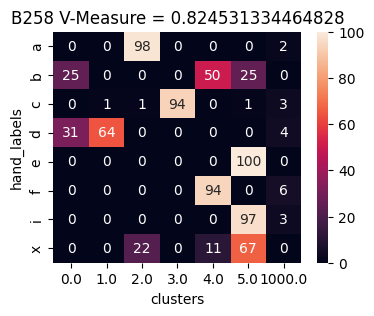

B385


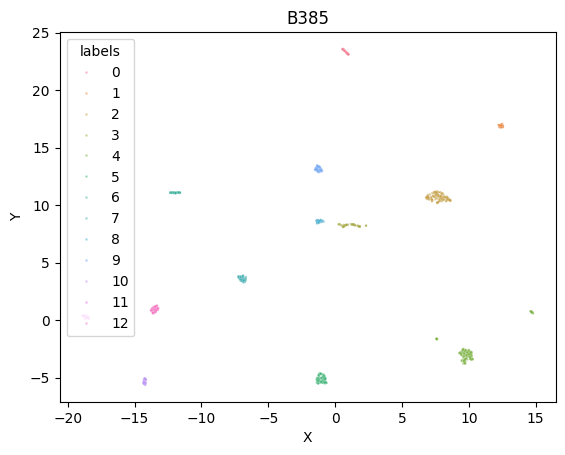

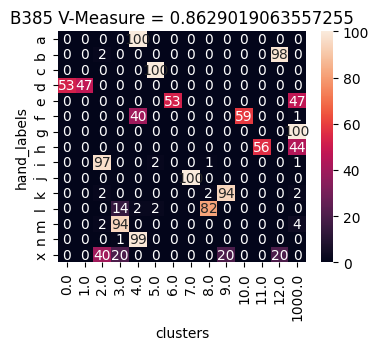

B402


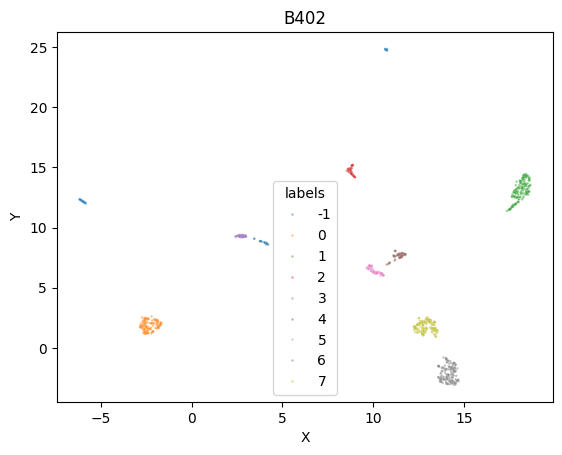

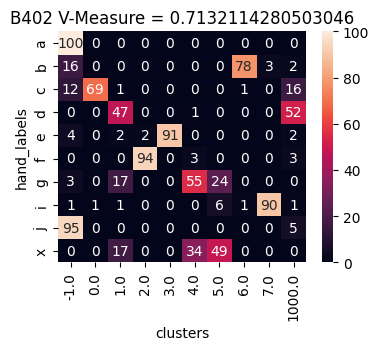

B447


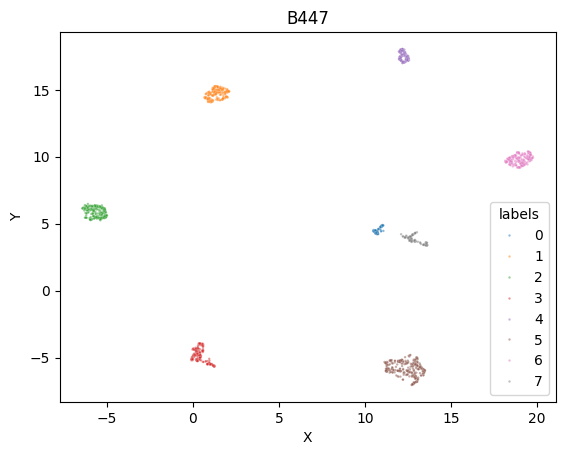

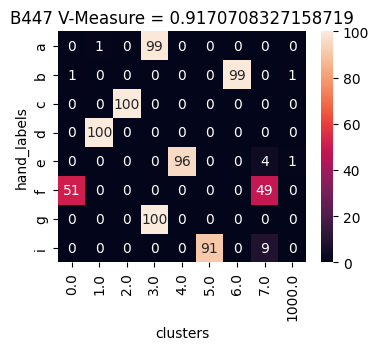

B507
Long Syllable Corrections! Spectrogram Duration = 314
Long Syllable Corrections! Spectrogram Duration = 319
Long Syllable Corrections! Spectrogram Duration = 369


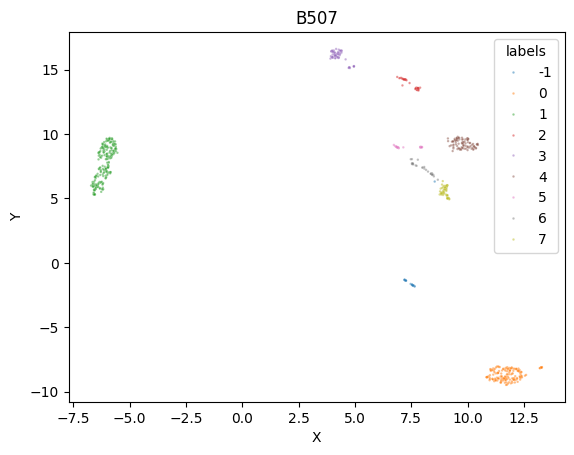

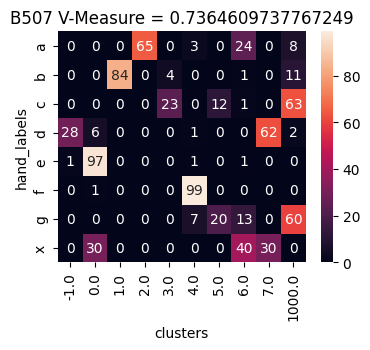

G255


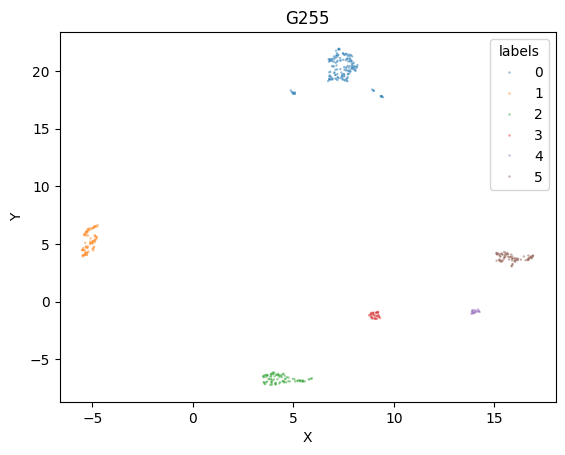

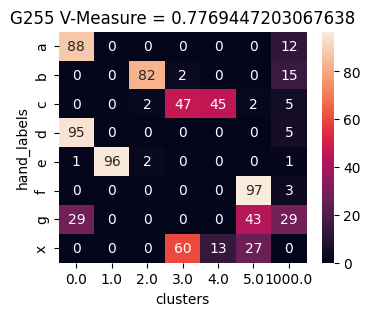

G397


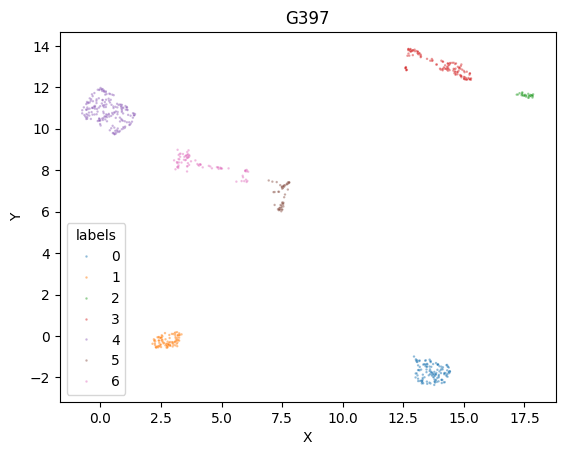

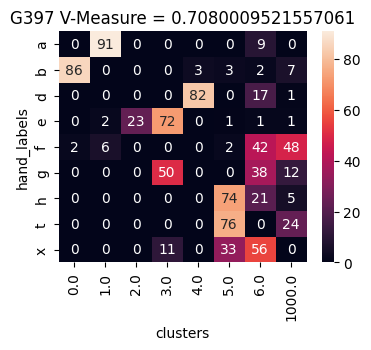

G402


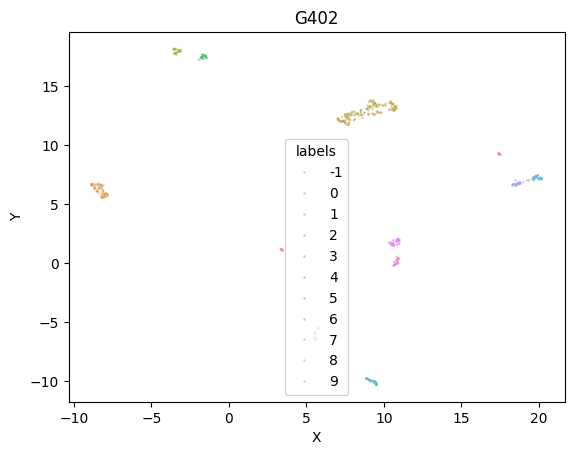

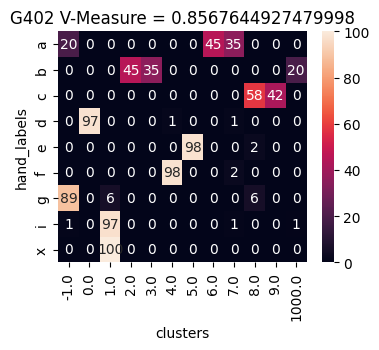

G413


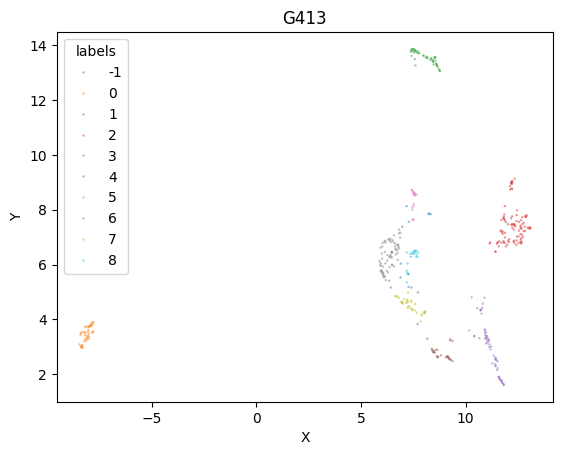

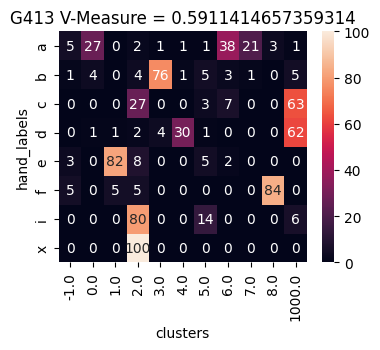

G437


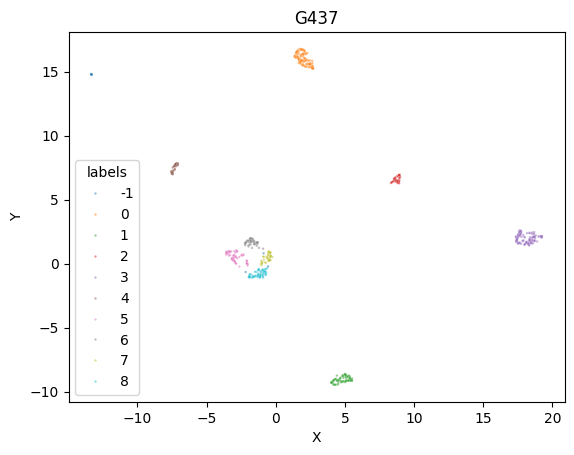

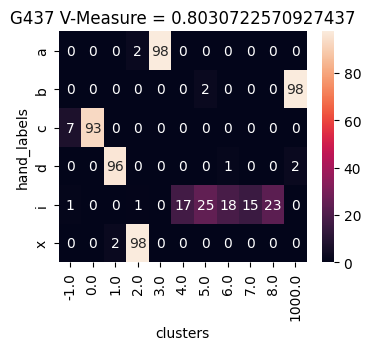

G439


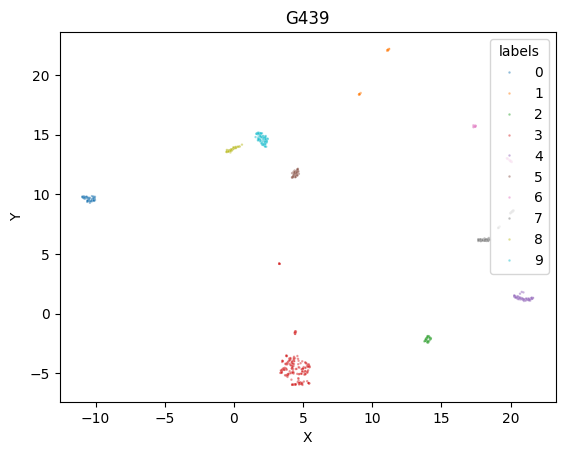

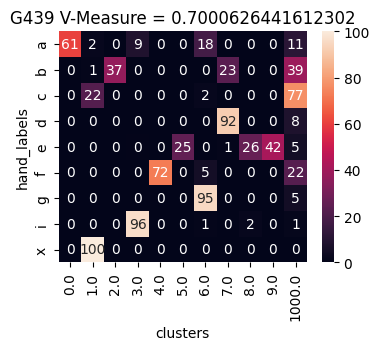

G524


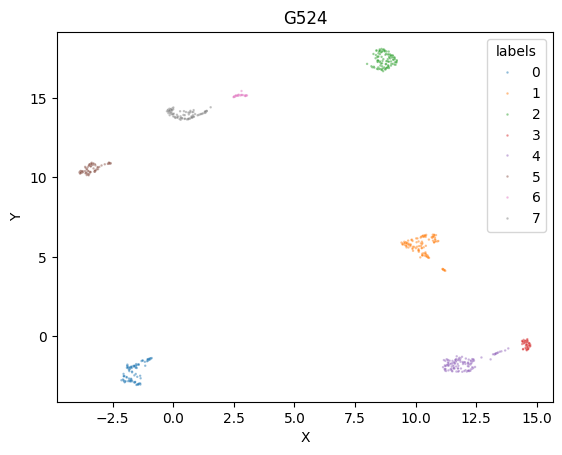

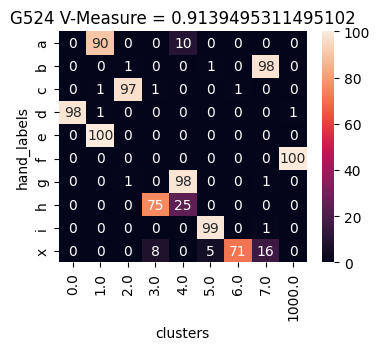

G528


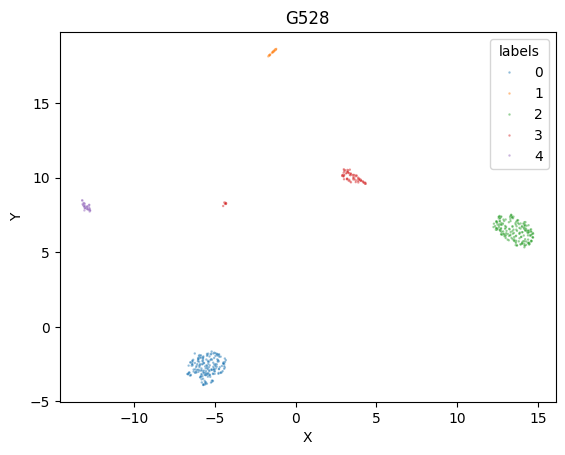

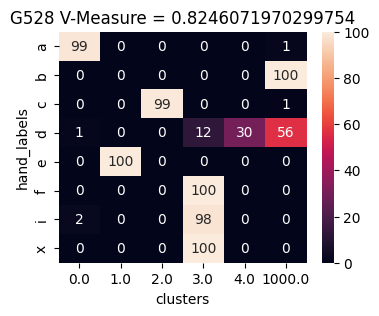

O144


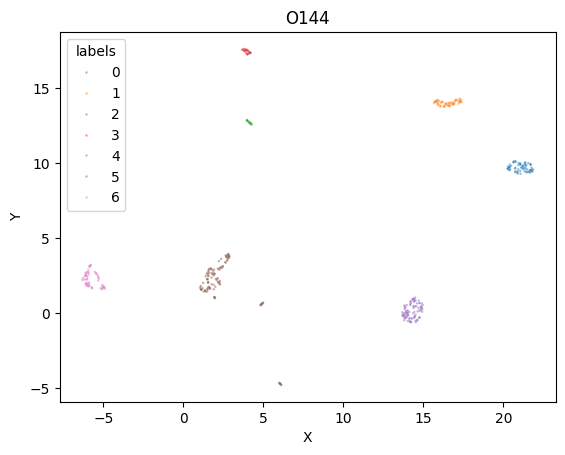

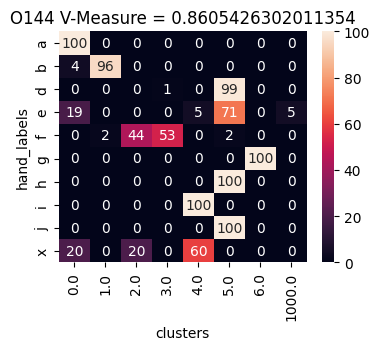

O254


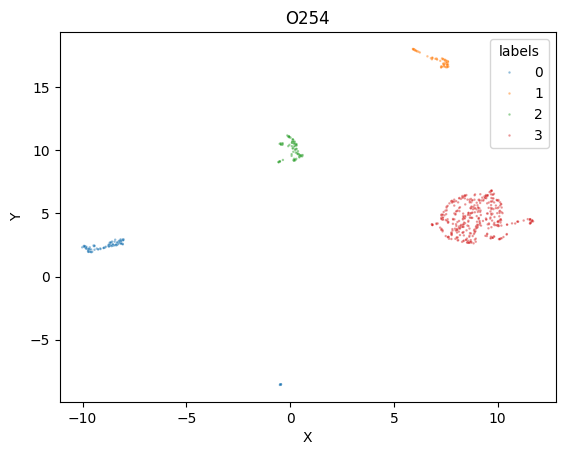

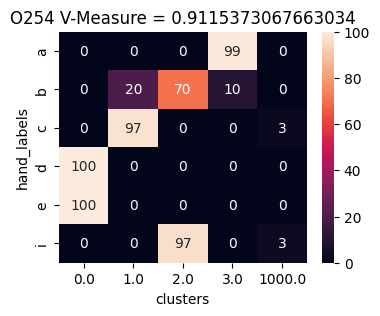

O421


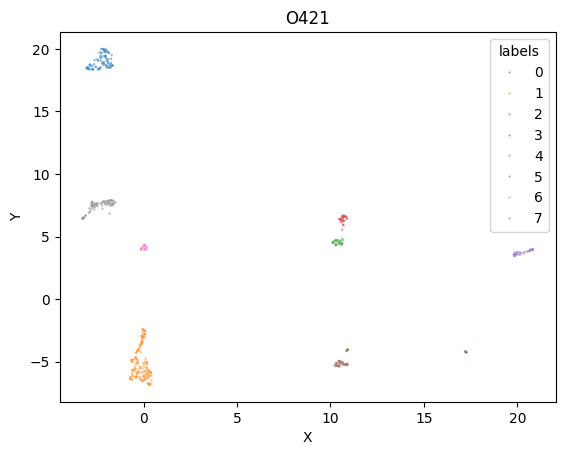

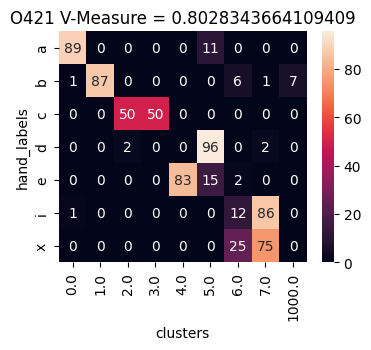

O440


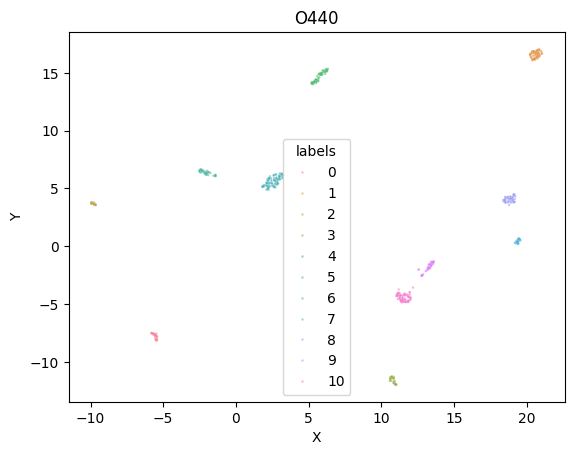

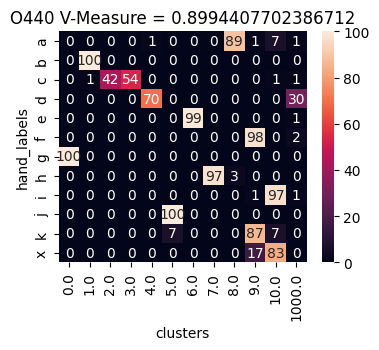

O512


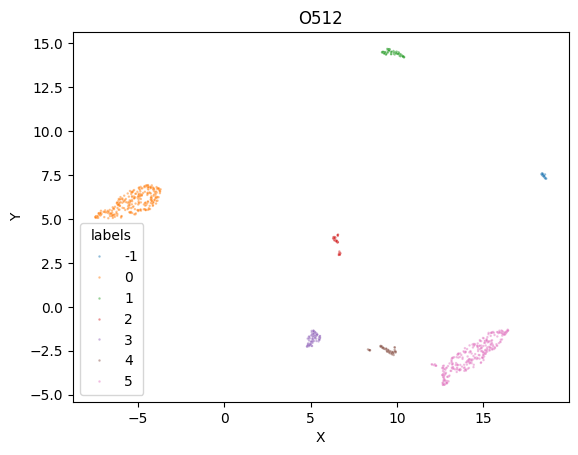

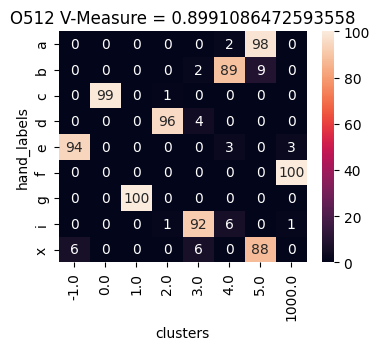

R402


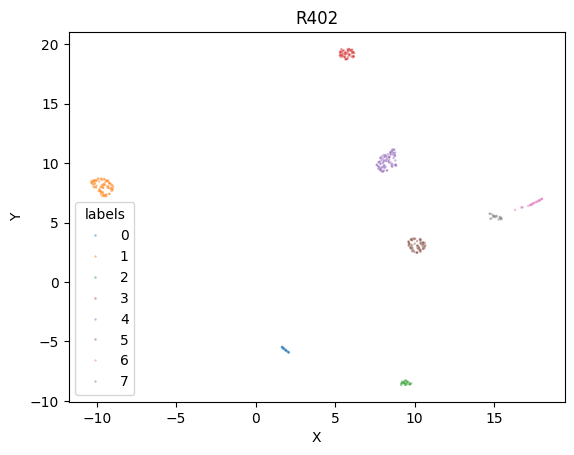

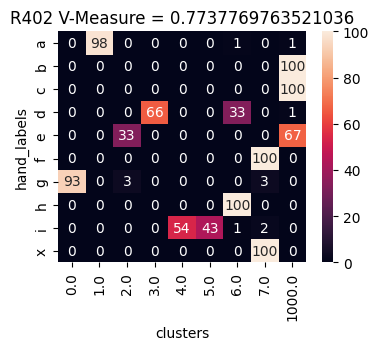

R425


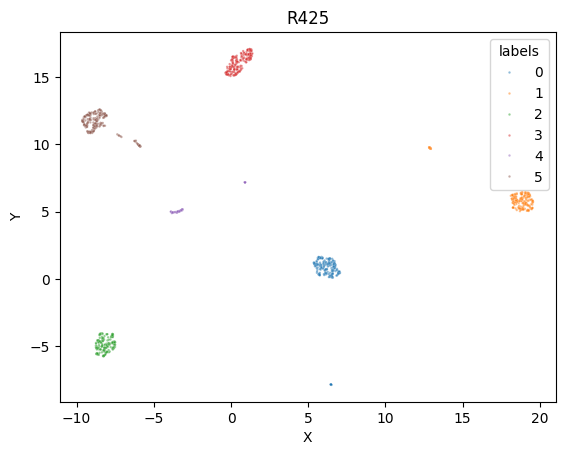

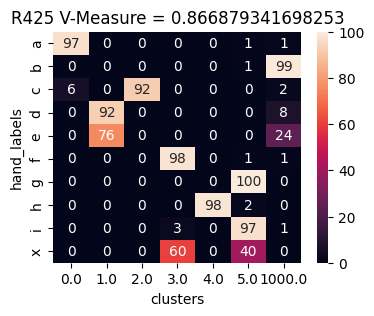

R469


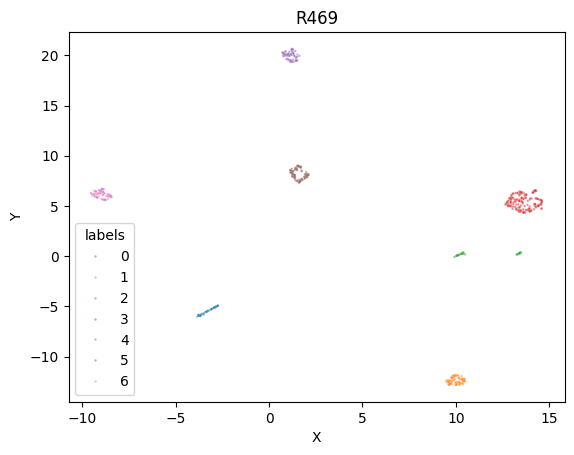

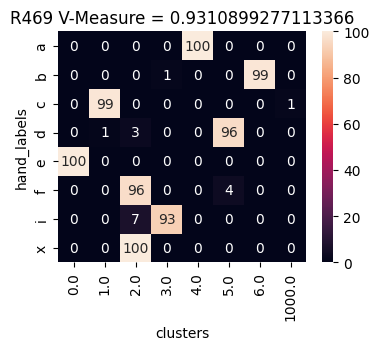

S132


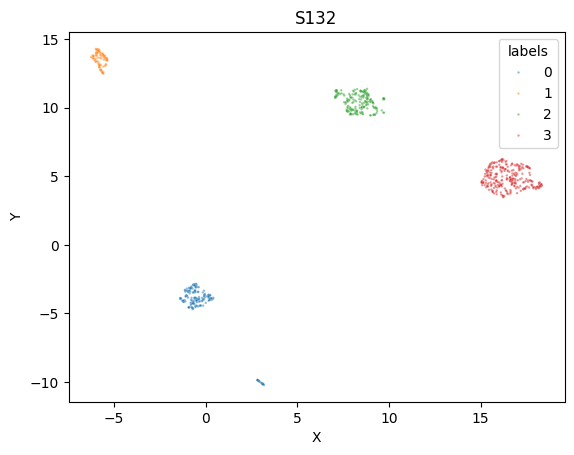

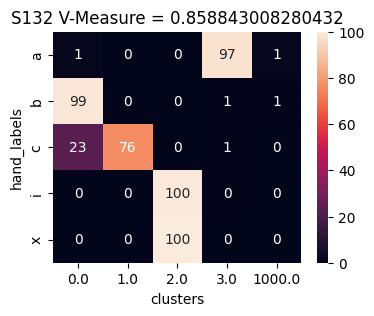

S421


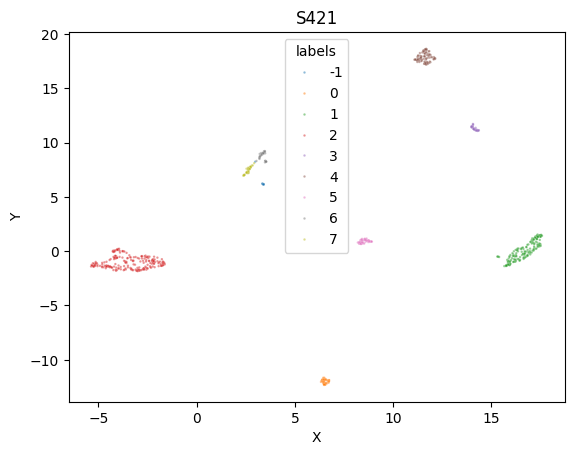

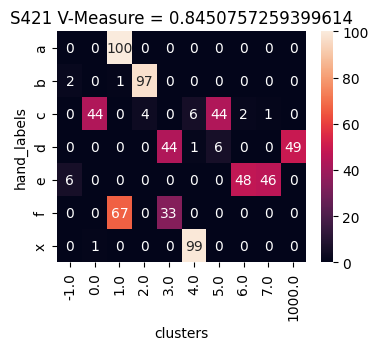

S525


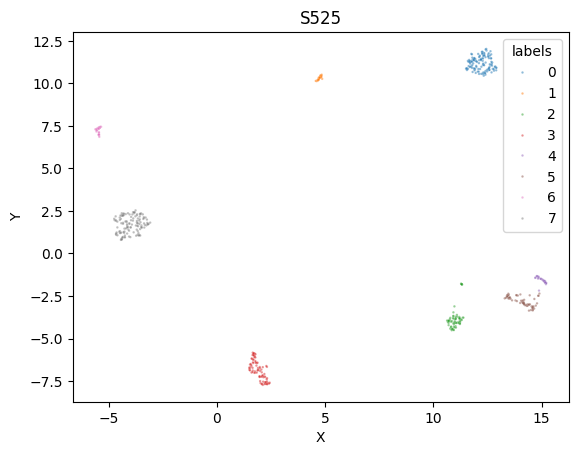

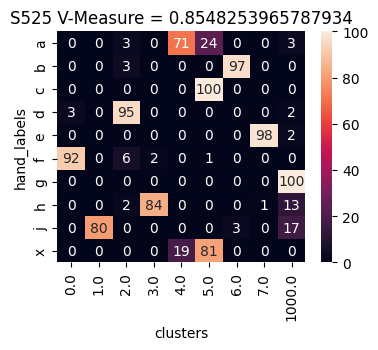

S528


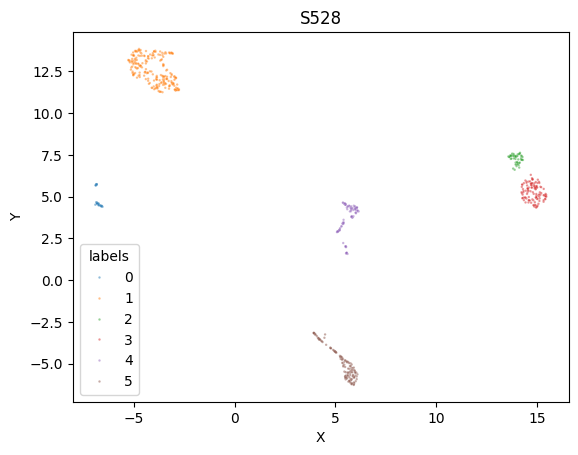

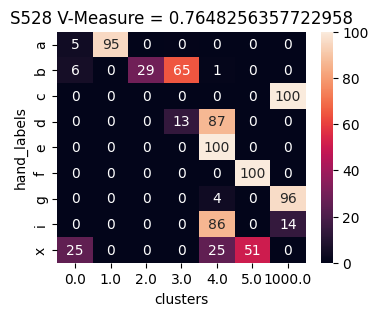

Y389
Long Syllable Corrections! Spectrogram Duration = 329
Long Syllable Corrections! Spectrogram Duration = 302
Long Syllable Corrections! Spectrogram Duration = 327
Long Syllable Corrections! Spectrogram Duration = 347
Long Syllable Corrections! Spectrogram Duration = 472
Long Syllable Corrections! Spectrogram Duration = 377
Long Syllable Corrections! Spectrogram Duration = 320
Long Syllable Corrections! Spectrogram Duration = 319
Long Syllable Corrections! Spectrogram Duration = 328
Long Syllable Corrections! Spectrogram Duration = 304
Long Syllable Corrections! Spectrogram Duration = 317
Long Syllable Corrections! Spectrogram Duration = 323
Long Syllable Corrections! Spectrogram Duration = 336


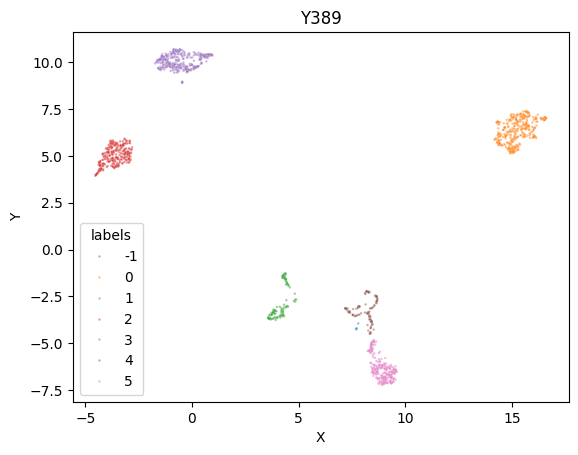

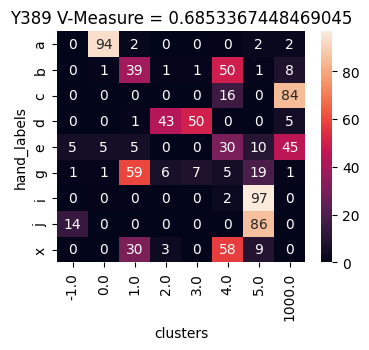

Y397
Long Syllable Corrections! Spectrogram Duration = 412
Long Syllable Corrections! Spectrogram Duration = 373
Long Syllable Corrections! Spectrogram Duration = 484
Long Syllable Corrections! Spectrogram Duration = 320
Long Syllable Corrections! Spectrogram Duration = 327
Long Syllable Corrections! Spectrogram Duration = 336
Long Syllable Corrections! Spectrogram Duration = 575
Long Syllable Corrections! Spectrogram Duration = 335
Long Syllable Corrections! Spectrogram Duration = 339
Long Syllable Corrections! Spectrogram Duration = 481
Long Syllable Corrections! Spectrogram Duration = 417


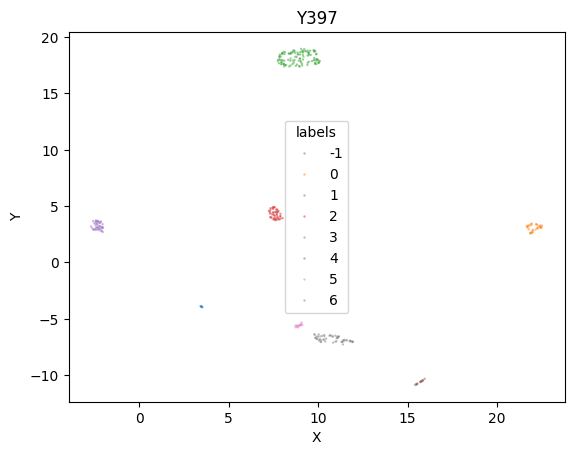

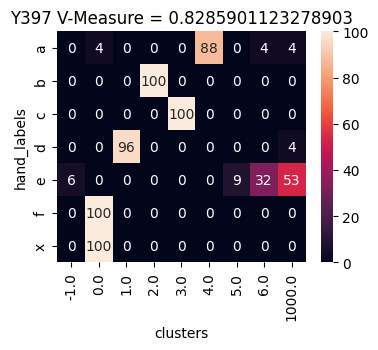

Y425


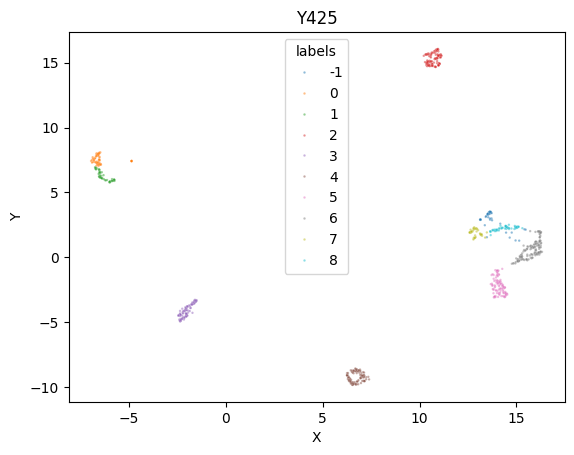

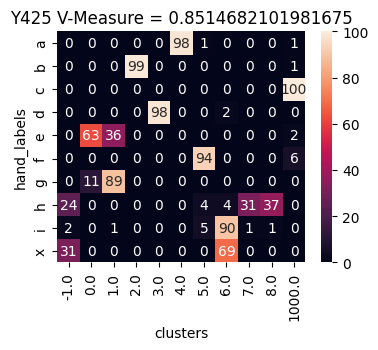

Y440


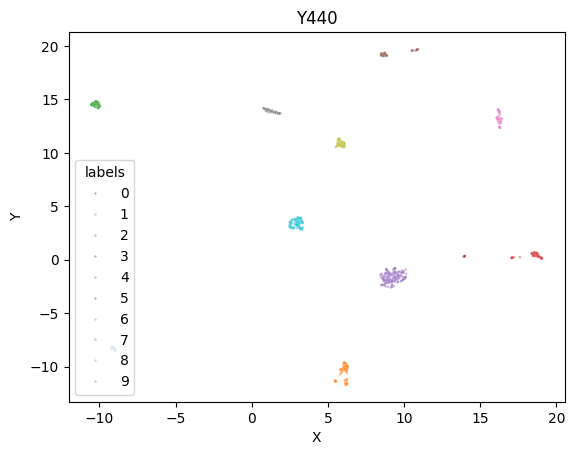

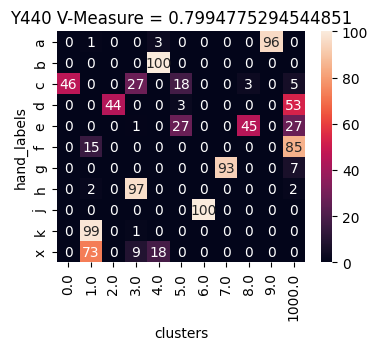

B524


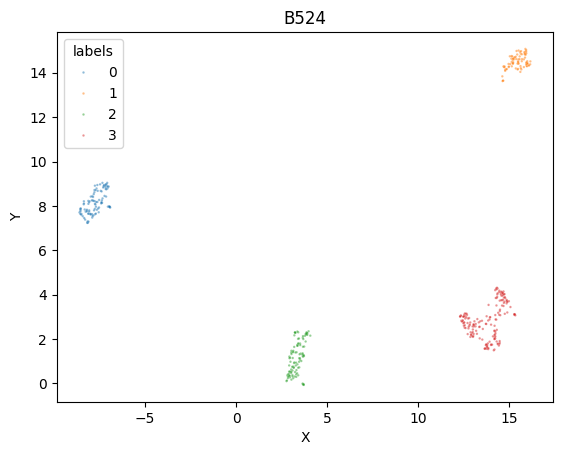

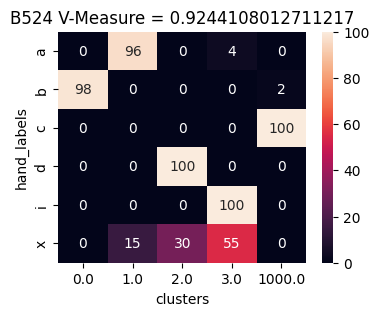

O434


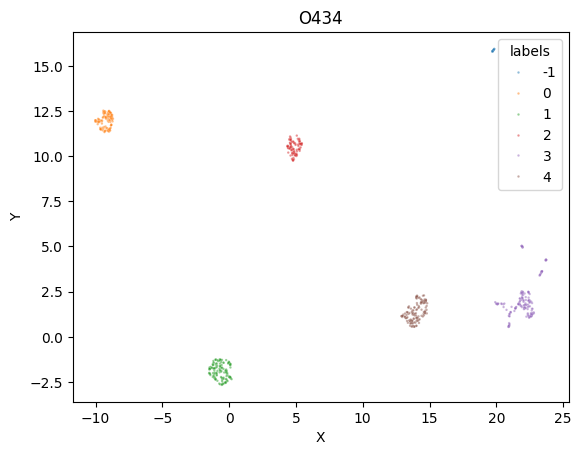

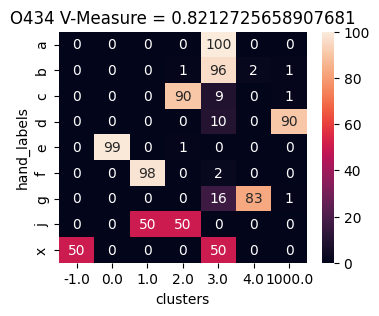

S389


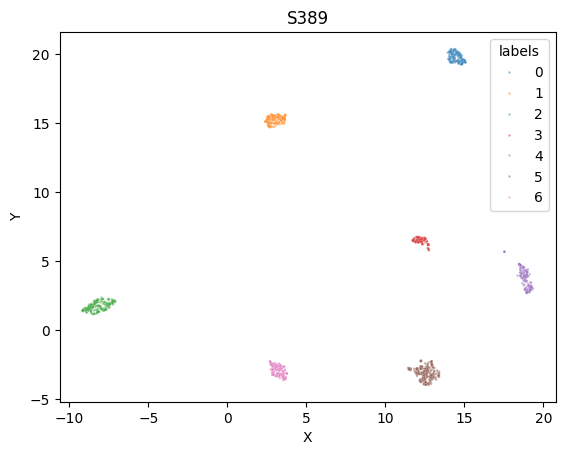

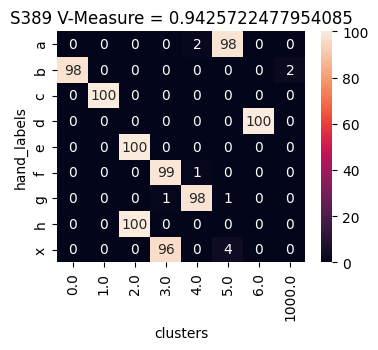

Y433


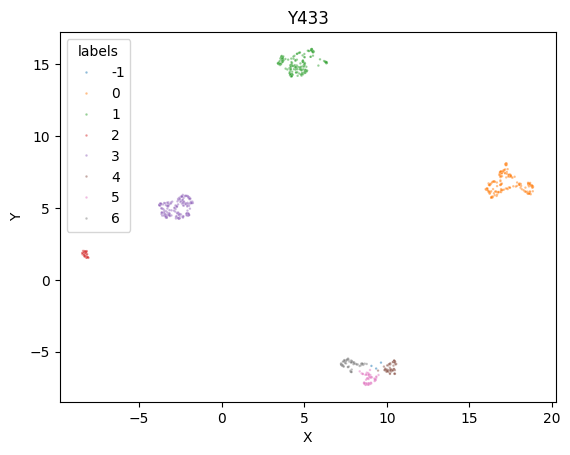

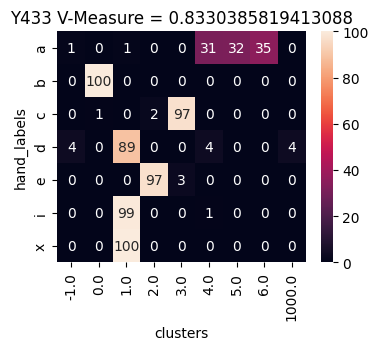

Y453


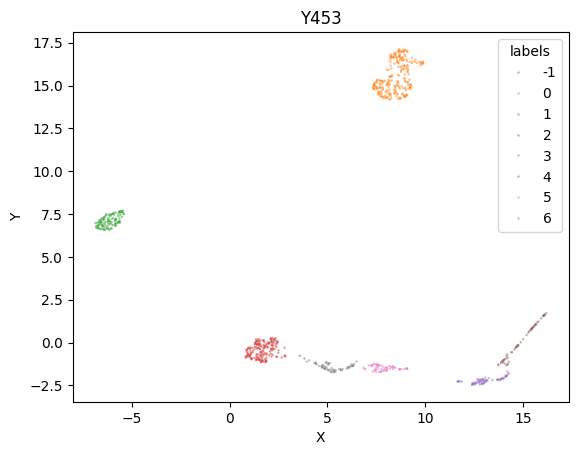

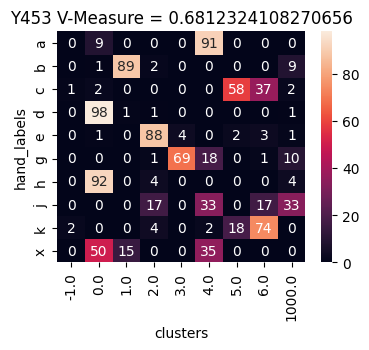

In [14]:

all_v_measures = pd.DataFrame()
for Bird_ID in All_Birds[:]:
    print(Bird_ID)
    segmentations_path = "E:\\Final_Bird_Dataset\\WhisperSeg_Segmentation_labeled\\" + Bird_ID + "_wseg.csv"
   
    song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" + Bird_ID + "\\"
    
    output_file = "E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" 

    #load segmentations
    segmentations = pd.read_csv(segmentations_path)

    #load segmentations
    segmentations = pd.read_csv(segmentations_path).drop(columns= ['Unnamed: 0'])

    segmentations = segmentations.rename(columns = {'onset' : 'onsets', 
                                                'offset' : 'offsets',
                                                'file' : 'files'})
    
    #Add syllable audio to dataframe
    syllable_dfs = pd.DataFrame()
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        for song_file in segmentations.files.unique():
            file_path = song_folder_path + song_file
            song = avn.dataloading.SongFile(file_path)
            song.bandpass_filter(500, 15000)

            syllable_df = segmentations[segmentations['files'] == song_file]

            #this section is based on avgn.signalprocessing.create_spectrogram_dataset.get_row_audio()
            syllable_df["audio"] = [song.data[int(st * song.sample_rate) : int(et * song.sample_rate)]
                                    for st, et in zip(syllable_df.onsets.values, syllable_df.offsets.values)]
            syllable_dfs = pd.concat([syllable_dfs, syllable_df])
        #Normalize the audio
        syllable_dfs['audio'] = [librosa.util.normalize(i) for i in syllable_dfs.audio.values]
        #compute spectrogram for each syllable
        syllables_spec = []

        for syllable in syllable_dfs.audio.values:
            
            syllable_spec = make_spec(syllable, 
                                        hop_length = hop_length, 
                                        win_length = win_length, 
                                        n_fft = n_fft, 
                                        ref_db = ref_db, 
                                        amin = amin, 
                                        min_level_db = min_level_db)
            if syllable_spec.shape[1] > 300:
                print("Long Syllable Corrections! Spectrogram Duration = " + str(syllable_spec.shape[1]))
                syllable_spec = syllable_spec[:, :300]

            syllables_spec.append(syllable_spec)
            
        #normalize spectrograms
        def norm(x):
            return (x - np.min(x)) / (np.max(x) - np.min(x))

        syllables_spec_norm = [norm(i) for i in syllables_spec]
        #Pad spectrograms for uniform dimensions
        spec_lens = [np.shape(i)[1] for i in syllables_spec]
        pad_length = np.max(spec_lens)


        syllables_spec_padded = []

        for spec in syllables_spec_norm:
            to_add = pad_length - np.shape(spec)[1]
            pad_left = np.floor(float(to_add) / 2).astype("int")
            pad_right = np.ceil(float(to_add) / 2).astype("int")
            spec_padded = np.pad(spec, [(0, 0), (pad_left, pad_right)], 'constant', constant_values = 0)
            syllables_spec_padded.append(spec_padded)
            
        #flatten the spectrograms into 1D
        specs_flattened = [spec.flatten() for spec in syllables_spec_padded]
        specs_flattened_array = np.array(specs_flattened)

        #Embed
        embedding = umap.UMAP(min_dist = 0.0, random_state = 42).fit_transform(specs_flattened_array)

        #cluster
        min_cluster_size = math.floor(embedding.shape[0] * min_cluster_prop)
        clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, core_dist_n_jobs=1, min_samples = 5).fit(embedding)

    hdbscan_df = syllable_dfs
    hdbscan_df["labels"] = clusterer.labels_
    hdbscan_df["X"] = embedding[:, 0]
    hdbscan_df["Y"] = embedding[:, 1]
    hdbscan_df['hdbscan_labels'] = hdbscan_df.labels
    hdbscan_df["labels"] = hdbscan_df['labels'].astype("category")

    hdbscan_df.to_csv(output_file)

    sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 3, alpha = 0.5)
    plt.title(Bird_ID)
    plt.show()

    #load ground truth labels
    hand_label_df_path = "C:/Grad_School/Code_and_software/Py_code/March_2021_redo/redo_data/labeled_songs/" + Bird_ID + "/" + Bird_ID + "_syll_df_evsonganaly.csv"
    hand_label_df = pd.read_csv(hand_label_df_path)
    hand_label_df = clean_syll_table(hand_label_df)
    
    #align tweetynet syllables with ground truth syllables
    all_matches = merge_hdbscan_hand_dfs(hdbscan_df, hand_label_df)
    all_matches = remove_nas_from_merge(all_matches)
    
    tweetynet_sylls = all_matches[all_matches.hdbscan_labels != 1000]

    
    #claculate v-measure
    v_measure = sklearn.metrics.v_measure_score(labels_true = all_matches.hand_label, 
                                               labels_pred = all_matches.hdbscan_labels)
    completeness = sklearn.metrics.completeness_score(labels_true = all_matches.hand_label, 
                                                labels_pred = all_matches.hdbscan_labels)
    homogeneity = sklearn.metrics.homogeneity_score(labels_true = all_matches.hand_label, 
                                              labels_pred = all_matches.hdbscan_labels)
    
    curr_v_measure = pd.DataFrame({"v_measure" : [v_measure], 
                                   "homogeneity" : [homogeneity], 
                                   "completeness" : [completeness],
                                      "Bird_ID" : Bird_ID, 
                                      "ref_db": ref_db, 
                                      "win_length" : win_length,
                                      "hop_length" : hop_length, 
                                      "n_fft" : n_fft, 
                                      "K_nn" : K, 
                                      "min_cluster_prop" : min_cluster_prop, 
                                      "embedding_method" : "UMAP", 
                                      "embedding_dimensions" : embedding_dim, 
                                      "min_level_db" : min_level_db})
    
    all_v_measures = pd.concat([all_v_measures, curr_v_measure])
    #plot confusion matrix
    plot_confusion_matrix(all_matches)
    plt.title(Bird_ID + " V-Measure = " + str(v_measure))
    plt.show()
    

I'm plotting all the birds so that I can pick one to clean up further for the example figures. 

Good candidates:
- B447 *
- G402 
- G524 *
- O421 **
- O440 **
- O512
- R469
- S525
- Y440 **
- S389

'*' means it's a candidate for the main figure, '**' means it's a candidate for the supplemental figure. 




## B447

In [14]:
plt.rcParams.update({'font.size': 10})

B447


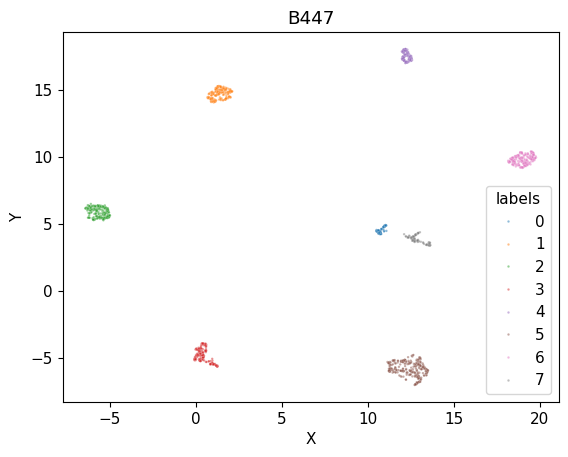

NameError: name 'all_v_measures' is not defined

In [15]:
Bird_ID = 'B447'

print(Bird_ID)
segmentations_path = "E:\\Final_Bird_Dataset\\WhisperSeg_Segmentation_labeled\\" + Bird_ID + "_wseg.csv"

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" + Bird_ID + "\\"

output_file = "E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" 

#load segmentations
segmentations = pd.read_csv(segmentations_path)

#load segmentations
segmentations = pd.read_csv(segmentations_path).drop(columns= ['Unnamed: 0'])

segmentations = segmentations.rename(columns = {'onset' : 'onsets', 
                                            'offset' : 'offsets',
                                            'file' : 'files'})

#Add syllable audio to dataframe
syllable_dfs = pd.DataFrame()
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for song_file in segmentations.files.unique():
        file_path = song_folder_path + song_file
        song = avn.dataloading.SongFile(file_path)
        song.bandpass_filter(500, 15000)

        syllable_df = segmentations[segmentations['files'] == song_file]

        #this section is based on avgn.signalprocessing.create_spectrogram_dataset.get_row_audio()
        syllable_df["audio"] = [song.data[int(st * song.sample_rate) : int(et * song.sample_rate)]
                                for st, et in zip(syllable_df.onsets.values, syllable_df.offsets.values)]
        syllable_dfs = pd.concat([syllable_dfs, syllable_df])
    #Normalize the audio
    syllable_dfs['audio'] = [librosa.util.normalize(i) for i in syllable_dfs.audio.values]
    #compute spectrogram for each syllable
    syllables_spec = []

    for syllable in syllable_dfs.audio.values:
        
        syllable_spec = make_spec(syllable, 
                                    hop_length = hop_length, 
                                    win_length = win_length, 
                                    n_fft = n_fft, 
                                    ref_db = ref_db, 
                                    amin = amin, 
                                    min_level_db = min_level_db)
        if syllable_spec.shape[1] > 300:
            print("Long Syllable Corrections! Spectrogram Duration = " + str(syllable_spec.shape[1]))
            syllable_spec = syllable_spec[:, :300]

        syllables_spec.append(syllable_spec)
        
    #normalize spectrograms
    def norm(x):
        return (x - np.min(x)) / (np.max(x) - np.min(x))

    syllables_spec_norm = [norm(i) for i in syllables_spec]
    #Pad spectrograms for uniform dimensions
    spec_lens = [np.shape(i)[1] for i in syllables_spec]
    pad_length = np.max(spec_lens)


    syllables_spec_padded = []

    for spec in syllables_spec_norm:
        to_add = pad_length - np.shape(spec)[1]
        pad_left = np.floor(float(to_add) / 2).astype("int")
        pad_right = np.ceil(float(to_add) / 2).astype("int")
        spec_padded = np.pad(spec, [(0, 0), (pad_left, pad_right)], 'constant', constant_values = 0)
        syllables_spec_padded.append(spec_padded)
        
    #flatten the spectrograms into 1D
    specs_flattened = [spec.flatten() for spec in syllables_spec_padded]
    specs_flattened_array = np.array(specs_flattened)

    #Embed
    embedding = umap.UMAP(min_dist = 0.0, random_state = 42).fit_transform(specs_flattened_array)

    #cluster
    min_cluster_size = math.floor(embedding.shape[0] * min_cluster_prop)
    clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, core_dist_n_jobs=1, min_samples = 5).fit(embedding)

hdbscan_df = syllable_dfs
hdbscan_df["labels"] = clusterer.labels_
hdbscan_df["X"] = embedding[:, 0]
hdbscan_df["Y"] = embedding[:, 1]
hdbscan_df['hdbscan_labels'] = hdbscan_df.labels
hdbscan_df["labels"] = hdbscan_df['labels'].astype("category")

hdbscan_df.to_csv(output_file)

sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 3, alpha = 0.5)
plt.title(Bird_ID)
plt.show()

#load ground truth labels
hand_label_df_path = "C:/Grad_School/Code_and_software/Py_code/March_2021_redo/redo_data/labeled_songs/" + Bird_ID + "/" + Bird_ID + "_syll_df_evsonganaly.csv"
hand_label_df = pd.read_csv(hand_label_df_path)
hand_label_df = clean_syll_table(hand_label_df)

#align tweetynet syllables with ground truth syllables
all_matches = merge_hdbscan_hand_dfs(hdbscan_df, hand_label_df)
all_matches = remove_nas_from_merge(all_matches)

tweetynet_sylls = all_matches[all_matches.hdbscan_labels != 1000]


#claculate v-measure
v_measure = sklearn.metrics.v_measure_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
completeness = sklearn.metrics.completeness_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
homogeneity = sklearn.metrics.homogeneity_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)

curr_v_measure = pd.DataFrame({"v_measure" : [v_measure], 
                                "homogeneity" : [homogeneity], 
                                "completeness" : [completeness],
                                    "Bird_ID" : Bird_ID, 
                                    "ref_db": ref_db, 
                                    "win_length" : win_length,
                                    "hop_length" : hop_length, 
                                    "n_fft" : n_fft, 
                                    "K_nn" : K, 
                                    "min_cluster_prop" : min_cluster_prop, 
                                    "embedding_method" : "UMAP", 
                                    "embedding_dimensions" : embedding_dim, 
                                    "min_level_db" : min_level_db})

#all_v_measures = pd.concat([all_v_measures, curr_v_measure])
#plot confusion matrix
plot_confusion_matrix(all_matches)
plt.title(Bird_ID + " V-Measure = " + str(v_measure))
plt.show()

In [16]:
hdbscan_df.shape

(1308, 9)

Text(0.5, 1.0, "Example Bird's Confusion Matrix")

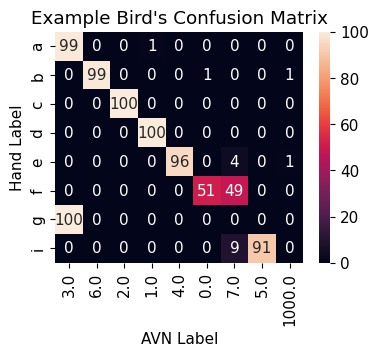

In [17]:
temp_df = pd.DataFrame({"hand_labels": all_matches.hand_label, 
                          "clusters": all_matches.hdbscan_labels})
conf_mat = pd.crosstab(temp_df.hand_labels, temp_df.clusters)
conf_mat = conf_mat.div(conf_mat.sum(axis = 1), axis = 0) * 100
conf_mat = conf_mat[[3.0, 6.0, 2.0, 1.0, 4.0, 0.0, 7.0, 5.0, 1000.0]]
plt.figure(figsize = (4, 3))
sns.heatmap(conf_mat, annot = True, fmt='.0f')
plt.ylabel('Hand Label')
plt.xlabel('AVN Label')
plt.title("Example Bird's Confusion Matrix")

([], [])

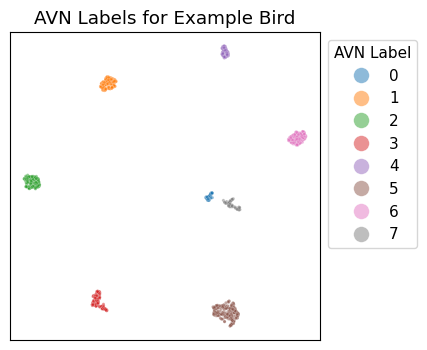

In [18]:
plt.figure(figsize = (4, 4))
sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 5, alpha = 0.5, legend = True)
plt.title('AVN Labels for Example Bird')
plt.legend(title = 'AVN Label', bbox_to_anchor = (1, 1), markerscale = 5)
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])

In [19]:
import avn.dataloading as dataloading
import avn.plotting as plotting

In [20]:
from avn.plotting import *

In [21]:
def plot_spectrogram_with_labels(syll_df, song_folder_path, Bird_ID, song_file = None, song_file_index = None, figsize = (80, 10), 
                                 cmap = 'tab20',  add_legend = True, fontsize = 24, title = None):
    """
    Plots the sectrogram of a specified file with syllable labels indicated through colored bars overlaid on spectrogram. 

    Parameters
    ----------
    syll_df: Pandas DataFrame
        pandas dataframe containing one row for every syllable to be analyzed
        from the subject bird. It must contain columns *onsets* and *offsets* 
        which contain the timestamp in seconds at which the syllable occurs 
        within a file, *files* which contains the name of the .wav file in 
        which the syllable is found, and *labels* which contains a categorical
        label for the syllable type. These can be generated through manual song
        annotation, or automated labeling methods. 

    song_folder_path: string
        Path to folder containing a subfolder called `Bird_ID`, which contains 
        .wav files of songs in syll_df. Should end with '/'.

    Bird_ID: string
        String containing a unique identifier for the subject bird.

    song_file: string, optional
        A value must be provided for `song_file` OR `song_file_index`, but not both. 
        String containing the name of a .wav file in `syll_df` and `song_folder_path/Bird_ID/` 
        to be plotted. 

    song_file_index: int >= 0, optional
        A value must be provided for `song_file` or `song_file_index`, but not both. 
        Denotes the index of the unique file in syll_df.files.unique() to be plotted. 

    figsize: tuple, optional
        Dimensions of figure to be plotted. The default is (80, 10). 

    cmap: matplotlib colormap, optional
        matplotlib color map for syllable labels. The colormap must contain more unique shades 
        than syllable label types. The default value is 'tab20'. 

    add_legend: boolean, optional
        If True, a legend mapping syllable labels to colors will be plotted over the spectrogram. 
        If False, no legend will be plotted. The default is True. 

    fontsize: float, optional
        The size of the font for the legend. The default is 24. 

    Returns
    -------
    None

    """
    #if both song file and song file index are prodivided, which file to plot if ambiguous so raise an error
    if (song_file != None) & (song_file_index != None):
        raise RuntimeError("Both `song_file` and `song_file_index` were provided. Please provide only one, otherwise the file to be plotted is ambiguous.")

    #set song file name according to song_file if it is provided
    if song_file != None: 
        song_file_name = song_file
    
    #set song file name according to song_file_index if it is provided
    if song_file_index != None: 
        song_file_name = syll_df.files.unique()[song_file_index]

    #if neither song file nor song file index are provided we will just plot the first file, but raise a warning
    if (song_file == None) & (song_file_index == None):
        song_file_name = syll_df.files.unique()[0]
        warnings.warn("No song_file or song_file_index were provided. The first file in syll_df will be plotted. To avoid ambiguity, please specify either song_file or song_file_index.")

    #set path to song file
    file_path = song_folder_path + Bird_ID + '/' + song_file_name

    #load song file
    song = dataloading.SongFile(file_path)
    song.bandpass_filter(500, 15000)

    #make spectrogram
    spectrogram = make_spectrogram(song)

    #plot spectrogram
    fig, ax = plt.subplots(figsize = figsize)
    plot_spectrogram(spectrogram, song.sample_rate, ax = ax)

    if title is None:
        #set title
        ax.set_title(Bird_ID + "    " + song_file_name)
    else:
        ax.set_title(title)

    ax.set_xlabel('Time (s)')
    #get y dimensions for adding syll labels
    ymin, ymax = ax.get_ylim()
    
    #create color dict for plotting syllable labels
    labels = syll_df.labels.unique()
    colors = plt.cm.get_cmap(cmap)(np.arange(len(labels)))#there must be more unique colors in cmap than label types
    color_dict = dict(zip(labels, colors))

    #loop over each syllable in syll_table in song_file:
    for ix, row in syll_df[syll_df.files == song_file_name].iterrows():

        #set color for syllable label
        color = color_dict[row.labels]

        #add patch to represent syllable label
        ax.add_patch(mpatches.Rectangle( [row.onsets, ymax - (ymax - ymin) / 10], 
                                         row.offsets -  row.onsets, 
                                         (ymax  - ymin) / 10,
                                         ec = 'none', 
                                         color = color))
    
    #if add_legend == True, add legend
    if add_legend == True: 
        markers  = [plt.Line2D([0, 0], [0, 0],  color = color, marker = 'o', linestyle = '') for color in color_dict.values()]
        ax.legend(markers, color_dict.keys(), numpoints = 1, facecolor = 'black', 
                  labelcolor = 'white', markerscale = 2, fontsize = fontsize, bbox_to_anchor = (1, 1), title = 'AVN Labels')

        plt.setp(ax.get_legend().get_title(), color='white')
    

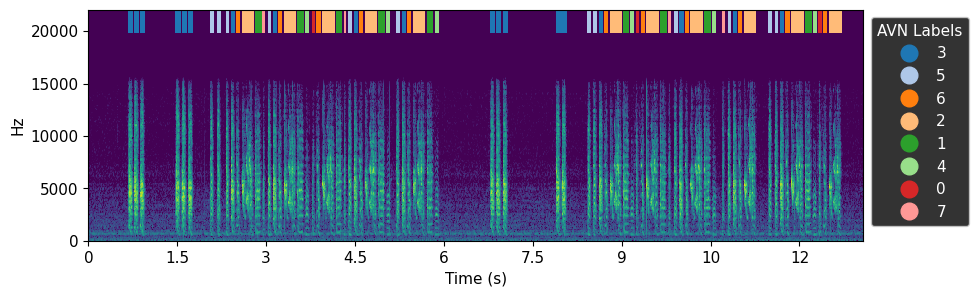

<Figure size 2000x500 with 0 Axes>

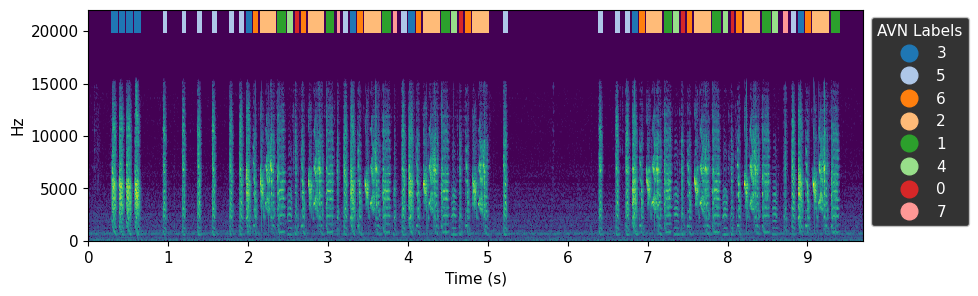

<Figure size 2000x500 with 0 Axes>

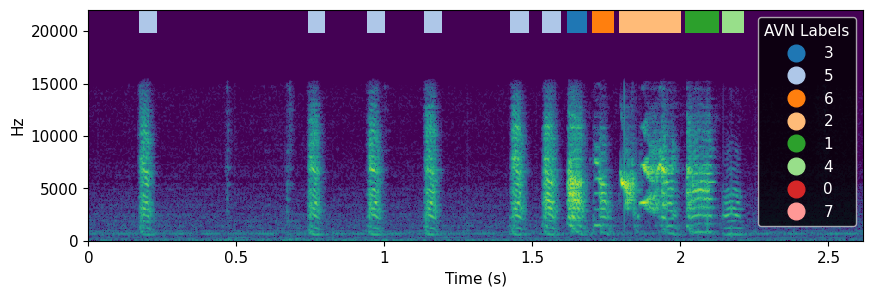

<Figure size 2000x500 with 0 Axes>

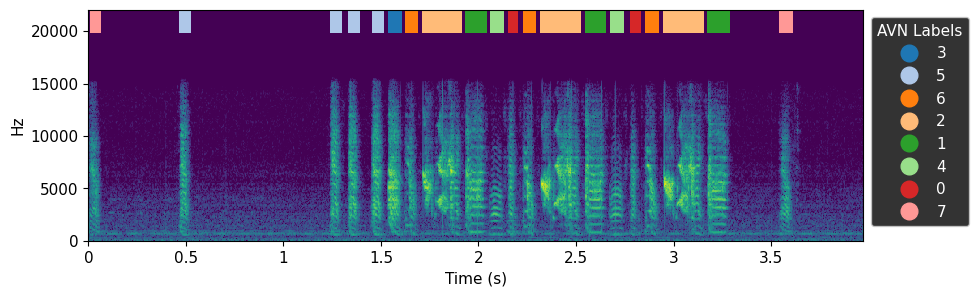

<Figure size 2000x500 with 0 Axes>

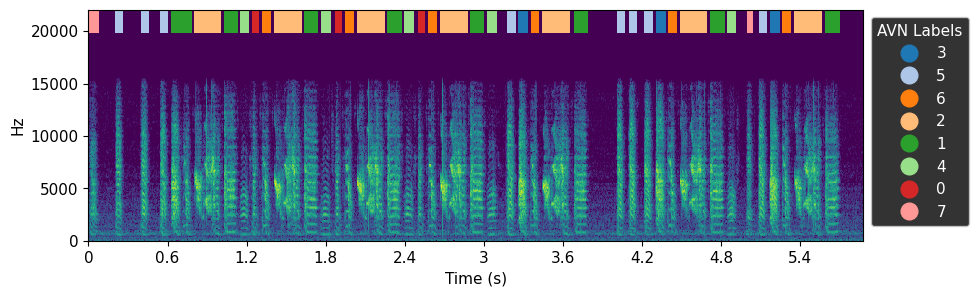

<Figure size 2000x500 with 0 Axes>

In [22]:
syll_df = pd.read_csv("E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" ) 

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" 

for i in range(5, 10):
        plot_spectrogram_with_labels(syll_df = syll_df, 
                                          song_folder_path = song_folder_path , 
                                          Bird_ID= Bird_ID, song_file_index=i, figsize = (10, 3), fontsize = 11, title = '')

## B447 - Larger Song Set

In [17]:
plt.rcParams.update({'font.size': 10})

In [18]:
np.random.seed(42)

B447


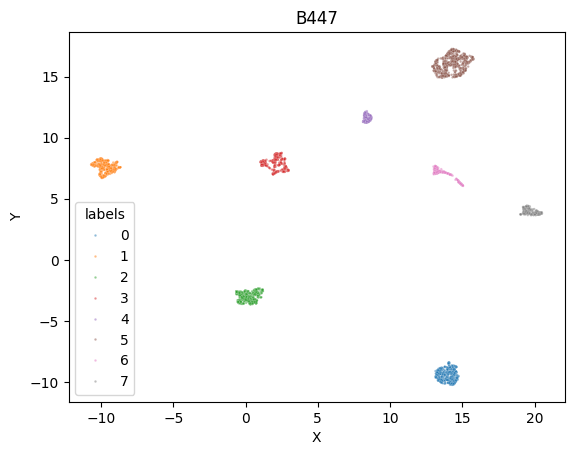

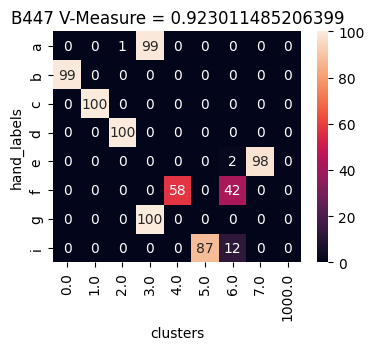

In [20]:
Bird_ID = 'B447'

print(Bird_ID)
segmentations_path = 'D:\\Final_Bird_Dataset\\WhisperSeg_Segmentation_larger_song_sets\\' + Bird_ID + "_wseg.csv"

song_folder_path = "G:\\Grad_School\\Song_Data\\avn_larger_song_sets\\" + Bird_ID + "/"

output_file = "D:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "larger_set_labels.csv" 

#load segmentations
segmentations = pd.read_csv(segmentations_path)

#load segmentations
segmentations = pd.read_csv(segmentations_path).drop(columns= ['Unnamed: 0'])

segmentations = segmentations.rename(columns = {'onset' : 'onsets', 
                                            'offset' : 'offsets',
                                            'file' : 'files'})

#Add syllable audio to dataframe
syllable_dfs = pd.DataFrame()
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for song_file in segmentations.files.unique():
        file_path = song_folder_path + song_file
        song = avn.dataloading.SongFile(file_path)
        song.bandpass_filter(500, 15000)

        syllable_df = segmentations[segmentations['files'] == song_file]

        #this section is based on avgn.signalprocessing.create_spectrogram_dataset.get_row_audio()
        syllable_df["audio"] = [song.data[int(st * song.sample_rate) : int(et * song.sample_rate)]
                                for st, et in zip(syllable_df.onsets.values, syllable_df.offsets.values)]
        syllable_dfs = pd.concat([syllable_dfs, syllable_df])
    #Normalize the audio
    syllable_dfs['audio'] = [librosa.util.normalize(i) for i in syllable_dfs.audio.values]
    #compute spectrogram for each syllable
    syllables_spec = []

    for syllable in syllable_dfs.audio.values:
        
        syllable_spec = make_spec(syllable, 
                                    hop_length = hop_length, 
                                    win_length = win_length, 
                                    n_fft = n_fft, 
                                    ref_db = ref_db, 
                                    amin = amin, 
                                    min_level_db = min_level_db)
        if syllable_spec.shape[1] > 300:
            print("Long Syllable Corrections! Spectrogram Duration = " + str(syllable_spec.shape[1]))
            syllable_spec = syllable_spec[:, :300]

        syllables_spec.append(syllable_spec)
        
    #normalize spectrograms
    def norm(x):
        return (x - np.min(x)) / (np.max(x) - np.min(x))

    syllables_spec_norm = [norm(i) for i in syllables_spec]
    #Pad spectrograms for uniform dimensions
    spec_lens = [np.shape(i)[1] for i in syllables_spec]
    pad_length = np.max(spec_lens)


    syllables_spec_padded = []

    for spec in syllables_spec_norm:
        to_add = pad_length - np.shape(spec)[1]
        pad_left = np.floor(float(to_add) / 2).astype("int")
        pad_right = np.ceil(float(to_add) / 2).astype("int")
        spec_padded = np.pad(spec, [(0, 0), (pad_left, pad_right)], 'constant', constant_values = 0)
        syllables_spec_padded.append(spec_padded)
        
    #flatten the spectrograms into 1D
    specs_flattened = [spec.flatten() for spec in syllables_spec_padded]
    specs_flattened_array = np.array(specs_flattened)

    #Embed
    embedding = umap.UMAP(min_dist = 0.0, random_state = 42).fit_transform(specs_flattened_array)

    #cluster
    min_cluster_size = math.floor(embedding.shape[0] * min_cluster_prop)
    clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, core_dist_n_jobs=1, min_samples = 5).fit(embedding)

hdbscan_df = syllable_dfs
hdbscan_df["labels"] = clusterer.labels_
hdbscan_df["X"] = embedding[:, 0]
hdbscan_df["Y"] = embedding[:, 1]
hdbscan_df['hdbscan_labels'] = hdbscan_df.labels
hdbscan_df["labels"] = hdbscan_df['labels'].astype("category")

hdbscan_df.to_csv(output_file)

sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 3, alpha = 0.5)
plt.title(Bird_ID)
plt.show()

#load ground truth labels
hand_label_df_path = "C:/Grad_School/Code_and_software/Py_code/March_2021_redo/redo_data/labeled_songs/" + Bird_ID + "/" + Bird_ID + "_syll_df_evsonganaly.csv"
hand_label_df = pd.read_csv(hand_label_df_path)
hand_label_df = clean_syll_table(hand_label_df)

#align tweetynet syllables with ground truth syllables
all_matches = merge_hdbscan_hand_dfs(hdbscan_df, hand_label_df)
all_matches = remove_nas_from_merge(all_matches)

tweetynet_sylls = all_matches[all_matches.hdbscan_labels != 1000]


#claculate v-measure
v_measure = sklearn.metrics.v_measure_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
completeness = sklearn.metrics.completeness_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
homogeneity = sklearn.metrics.homogeneity_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)

curr_v_measure = pd.DataFrame({"v_measure" : [v_measure], 
                                "homogeneity" : [homogeneity], 
                                "completeness" : [completeness],
                                    "Bird_ID" : Bird_ID, 
                                    "ref_db": ref_db, 
                                    "win_length" : win_length,
                                    "hop_length" : hop_length, 
                                    "n_fft" : n_fft, 
                                    "K_nn" : K, 
                                    "min_cluster_prop" : min_cluster_prop, 
                                    "embedding_method" : "UMAP", 
                                    "embedding_dimensions" : embedding_dim, 
                                    "min_level_db" : min_level_db})

#all_v_measures = pd.concat([all_v_measures, curr_v_measure])
#plot confusion matrix
plot_confusion_matrix(all_matches)
plt.title(Bird_ID + " V-Measure = " + str(v_measure))
plt.show()

In [21]:
hdbscan_df.shape

(3131, 9)

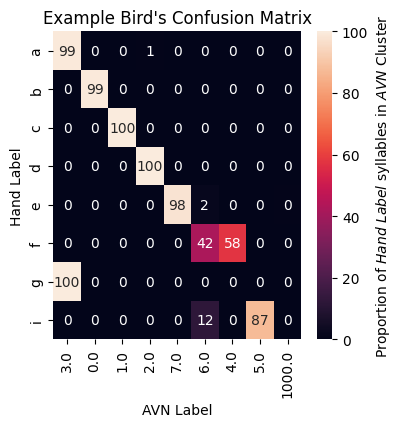

In [36]:
temp_df = pd.DataFrame({"hand_labels": all_matches.hand_label, 
                          "clusters": all_matches.hdbscan_labels})
conf_mat = pd.crosstab(temp_df.hand_labels, temp_df.clusters)
conf_mat = conf_mat.div(conf_mat.sum(axis = 1), axis = 0) * 100
conf_mat = conf_mat[[3.0, 0, 1, 2, 7, 6, 4, 5, 1000]]
plt.figure(figsize = (4, 4))
sns.heatmap(conf_mat, annot = True, fmt='.0f', 
            cbar_kws={'label': 'Proportion of $Hand$ $Label$ syllables in $AVN$ Cluster'})
plt.ylabel('Hand Label')
plt.xlabel('AVN Label')
plt.title("Example Bird's Confusion Matrix")
plt.savefig('B447_larger_song_set_conf_mat.svg')

([], [])

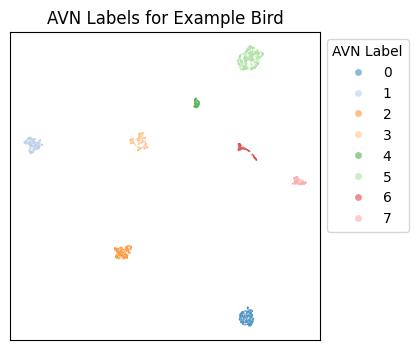

In [73]:
plt.figure(figsize = (4, 4))
sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 1, alpha = 0.5, legend = True, 
                palette = 'tab20')
plt.title('AVN Labels for Example Bird')
plt.legend(title = 'AVN Label', bbox_to_anchor = (1, 1), markerscale = 5)
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])

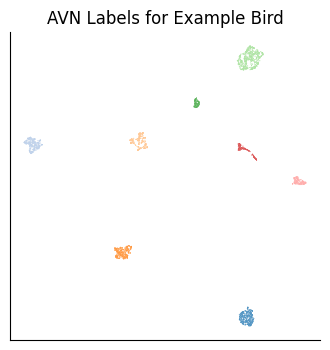

In [81]:
plt.figure(figsize = (4, 4))
sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 0.5, alpha = 1, legend = False, 
                palette = 'tab20',)
plt.title('AVN Labels for Example Bird')
sns.despine()
#plt.legend(title = 'AVN Label', bbox_to_anchor = (1, 1), markerscale = 5)
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])
plt.savefig('B447_larger_song_set_umap.svg')


In [43]:
import avn.dataloading as dataloading
import avn.plotting as plotting

In [44]:
from avn.plotting import *

In [97]:
def plot_spectrogram_with_labels(syll_df, song_folder_path, Bird_ID, song_file = None, song_file_index = None, figsize = (80, 10), 
                                 cmap = 'tab20',  add_legend = True, fontsize = 24, title = None, out_path = None):
    """
    Plots the sectrogram of a specified file with syllable labels indicated through colored bars overlaid on spectrogram. 

    Parameters
    ----------
    syll_df: Pandas DataFrame
        pandas dataframe containing one row for every syllable to be analyzed
        from the subject bird. It must contain columns *onsets* and *offsets* 
        which contain the timestamp in seconds at which the syllable occurs 
        within a file, *files* which contains the name of the .wav file in 
        which the syllable is found, and *labels* which contains a categorical
        label for the syllable type. These can be generated through manual song
        annotation, or automated labeling methods. 

    song_folder_path: string
        Path to folder containing a subfolder called `Bird_ID`, which contains 
        .wav files of songs in syll_df. Should end with '/'.

    Bird_ID: string
        String containing a unique identifier for the subject bird.

    song_file: string, optional
        A value must be provided for `song_file` OR `song_file_index`, but not both. 
        String containing the name of a .wav file in `syll_df` and `song_folder_path/Bird_ID/` 
        to be plotted. 

    song_file_index: int >= 0, optional
        A value must be provided for `song_file` or `song_file_index`, but not both. 
        Denotes the index of the unique file in syll_df.files.unique() to be plotted. 

    figsize: tuple, optional
        Dimensions of figure to be plotted. The default is (80, 10). 

    cmap: matplotlib colormap, optional
        matplotlib color map for syllable labels. The colormap must contain more unique shades 
        than syllable label types. The default value is 'tab20'. 

    add_legend: boolean, optional
        If True, a legend mapping syllable labels to colors will be plotted over the spectrogram. 
        If False, no legend will be plotted. The default is True. 

    fontsize: float, optional
        The size of the font for the legend. The default is 24. 

    Returns
    -------
    None

    """
    #if both song file and song file index are prodivided, which file to plot if ambiguous so raise an error
    if (song_file != None) & (song_file_index != None):
        raise RuntimeError("Both `song_file` and `song_file_index` were provided. Please provide only one, otherwise the file to be plotted is ambiguous.")

    #set song file name according to song_file if it is provided
    if song_file != None: 
        song_file_name = song_file
    
    #set song file name according to song_file_index if it is provided
    if song_file_index != None: 
        song_file_name = syll_df.files.unique()[song_file_index]

    #if neither song file nor song file index are provided we will just plot the first file, but raise a warning
    if (song_file == None) & (song_file_index == None):
        song_file_name = syll_df.files.unique()[0]
        warnings.warn("No song_file or song_file_index were provided. The first file in syll_df will be plotted. To avoid ambiguity, please specify either song_file or song_file_index.")

    #set path to song file
    file_path = song_folder_path + Bird_ID + '/' + song_file_name

    #load song file
    song = dataloading.SongFile(file_path)
    song.bandpass_filter(500, 15000)

    #make spectrogram
    spectrogram = make_spectrogram(song)

    #plot spectrogram
    fig, ax = plt.subplots(figsize = figsize)
    plot_spectrogram(spectrogram, song.sample_rate, ax = ax)

    if title is None:
        #set title
        ax.set_title(Bird_ID + "    " + song_file_name)
    else:
        ax.set_title(title)

    ax.set_xlabel('Time (s)')

    def numfmt(x, pos): # your custom formatter function: divide by 100.0
        s = '{:.0f}'.format(x / 1000.0)
        return s

    import matplotlib.ticker as tkr     # has classes for tick-locating and -formatting
    yfmt = tkr.FuncFormatter(numfmt)

    ax.yaxis.set_major_formatter(yfmt)
    ax.set_ylabel('kHz')

    #get y dimensions for adding syll labels
    ymin, ymax = ax.get_ylim()
    
    #create color dict for plotting syllable labels
    labels = syll_df.labels.unique()
    labels.sort()
    colors = plt.cm.get_cmap(cmap)(np.arange(len(labels)))#there must be more unique colors in cmap than label types
    color_dict = dict(zip(labels, colors))

    #loop over each syllable in syll_table in song_file:
    for ix, row in syll_df[syll_df.files == song_file_name].iterrows():

        #set color for syllable label
        color = color_dict[row.labels]

        #add patch to represent syllable label
        ax.add_patch(mpatches.Rectangle( [row.onsets, ymax - (ymax - ymin) / 5], 
                                         row.offsets -  row.onsets, 
                                         #(ymax  - ymin) / 1,
                                         10000,
                                         ec = 'none', 
                                         color = color))
    
    #if add_legend == True, add legend
    if add_legend == True: 
        markers  = [plt.Line2D([0, 0], [0, 0],  color = color, marker = 'o', linestyle = '') for color in color_dict.values()]
        ax.legend(markers, color_dict.keys(), numpoints = 1, facecolor = 'black', 
                  labelcolor = 'white', markerscale = 2, fontsize = fontsize, bbox_to_anchor = (1, 1.05), title = 'AVN Labels')

        plt.setp(ax.get_legend().get_title(), color='white')

    if out_path is not None:
        ax.savefig(out_path, transparent = True)
    

In [47]:
syll_df

,Unnamed: 0,onset,offset,cluster,file
0,0,0.942,1.023,zebra_finch_0,B447_43505.26440066_2_9_7_20_40.wav
1,1,1.033,1.123,zebra_finch_0,B447_43505.26440066_2_9_7_20_40.wav
2,2,2.097,2.178,zebra_finch_0,B447_43505.26440066_2_9_7_20_40.wav
3,3,2.198,2.278,zebra_finch_0,B447_43505.26440066_2_9_7_20_40.wav
4,4,2.438,2.502,zebra_finch_0,B447_43505.26440066_2_9_7_20_40.wav
...,...,...,...,...,...
3126,9,1.368,1.443,zebra_finch_0,B447_43505.61929681_2_9_17_12_9.wav
3127,10,1.483,1.537,zebra_finch_0,B447_43505.61929681_2_9_17_12_9.wav
3128,11,1.562,1.632,zebra_finch_0,B447_43505.61929681_2_9_17_12_9.wav
3129,12,1.652,1.867,zebra_finch_0,B447_43505.61929681_2_9_17_12_9.wav


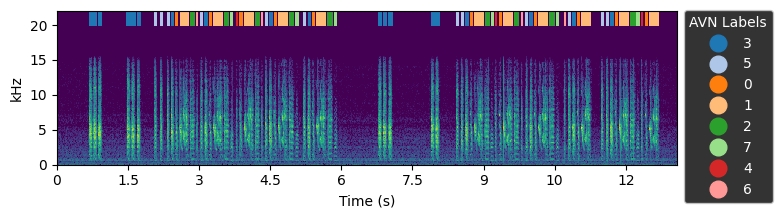

<Figure size 2000x500 with 0 Axes>

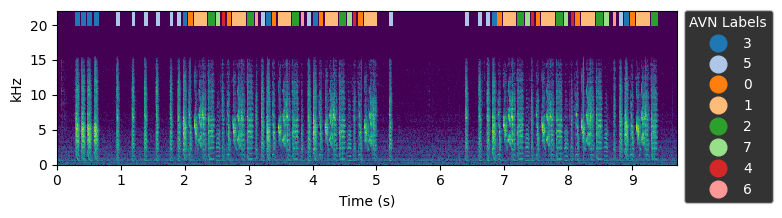

<Figure size 2000x500 with 0 Axes>

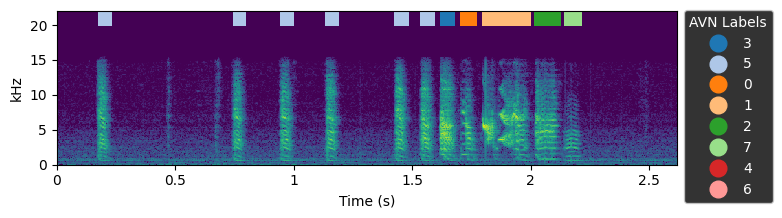

<Figure size 2000x500 with 0 Axes>

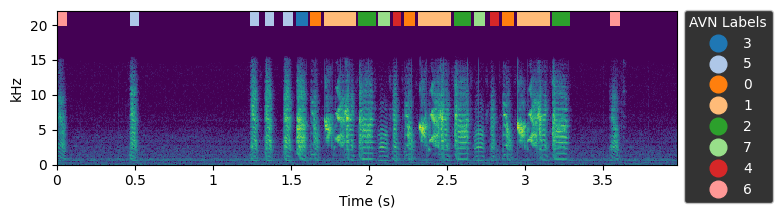

<Figure size 2000x500 with 0 Axes>

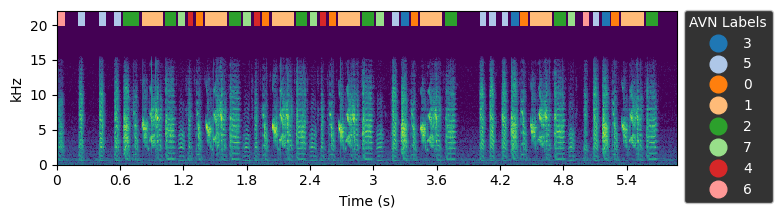

<Figure size 2000x500 with 0 Axes>

In [58]:
syll_df = pd.read_csv("D:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "larger_set_labels.csv"  ) 

song_folder_path = "G:\\Grad_School\\Song_Data\\avn_larger_song_sets\\" 

for i in range(5, 10):
        plot_spectrogram_with_labels(syll_df = syll_df, 
                                          song_folder_path = song_folder_path , 
                                          Bird_ID= Bird_ID, song_file_index=i, figsize = (8, 2), fontsize = 10, title = '')

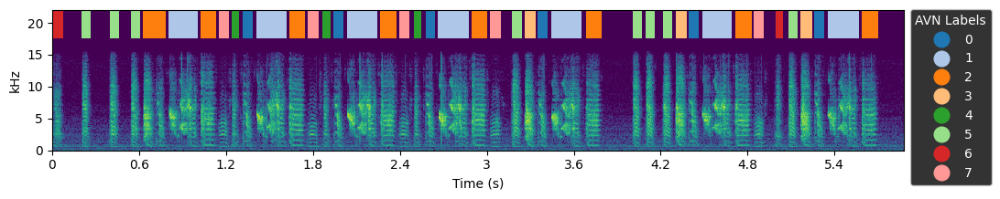

<Figure size 2000x500 with 0 Axes>

In [98]:
plot_spectrogram_with_labels(syll_df = syll_df, 
                                          song_folder_path = song_folder_path , 
                                          Bird_ID= Bird_ID, song_file_index=9, 
                                          figsize = (12, 2), fontsize = 10, title = '', )


## G524

## G524

G524


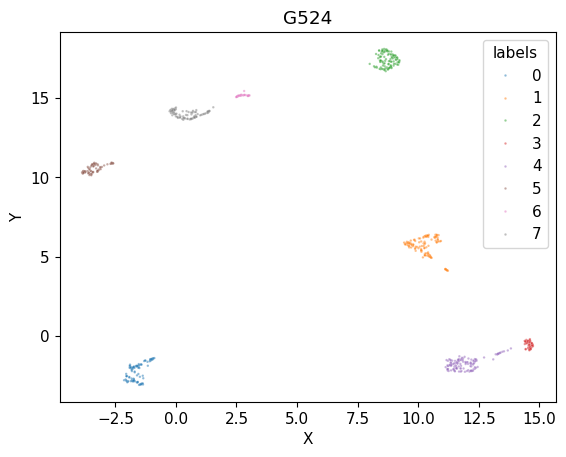

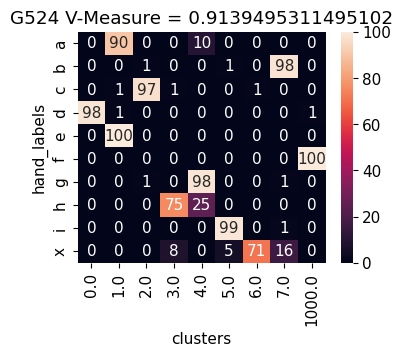

In [23]:
Bird_ID = 'G524'

print(Bird_ID)
segmentations_path = "E:\\Final_Bird_Dataset\\WhisperSeg_Segmentation_labeled\\" + Bird_ID + "_wseg.csv"

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" + Bird_ID + "\\"

output_file = "E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" 

#load segmentations
segmentations = pd.read_csv(segmentations_path)

#load segmentations
segmentations = pd.read_csv(segmentations_path).drop(columns= ['Unnamed: 0'])

segmentations = segmentations.rename(columns = {'onset' : 'onsets', 
                                            'offset' : 'offsets',
                                            'file' : 'files'})

#Add syllable audio to dataframe
syllable_dfs = pd.DataFrame()
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for song_file in segmentations.files.unique():
        file_path = song_folder_path + song_file
        song = avn.dataloading.SongFile(file_path)
        song.bandpass_filter(500, 15000)

        syllable_df = segmentations[segmentations['files'] == song_file]

        #this section is based on avgn.signalprocessing.create_spectrogram_dataset.get_row_audio()
        syllable_df["audio"] = [song.data[int(st * song.sample_rate) : int(et * song.sample_rate)]
                                for st, et in zip(syllable_df.onsets.values, syllable_df.offsets.values)]
        syllable_dfs = pd.concat([syllable_dfs, syllable_df])
    #Normalize the audio
    syllable_dfs['audio'] = [librosa.util.normalize(i) for i in syllable_dfs.audio.values]
    #compute spectrogram for each syllable
    syllables_spec = []

    for syllable in syllable_dfs.audio.values:
        
        syllable_spec = make_spec(syllable, 
                                    hop_length = hop_length, 
                                    win_length = win_length, 
                                    n_fft = n_fft, 
                                    ref_db = ref_db, 
                                    amin = amin, 
                                    min_level_db = min_level_db)
        if syllable_spec.shape[1] > 300:
            print("Long Syllable Corrections! Spectrogram Duration = " + str(syllable_spec.shape[1]))
            syllable_spec = syllable_spec[:, :300]

        syllables_spec.append(syllable_spec)
        
    #normalize spectrograms
    def norm(x):
        return (x - np.min(x)) / (np.max(x) - np.min(x))

    syllables_spec_norm = [norm(i) for i in syllables_spec]
    #Pad spectrograms for uniform dimensions
    spec_lens = [np.shape(i)[1] for i in syllables_spec]
    pad_length = np.max(spec_lens)


    syllables_spec_padded = []

    for spec in syllables_spec_norm:
        to_add = pad_length - np.shape(spec)[1]
        pad_left = np.floor(float(to_add) / 2).astype("int")
        pad_right = np.ceil(float(to_add) / 2).astype("int")
        spec_padded = np.pad(spec, [(0, 0), (pad_left, pad_right)], 'constant', constant_values = 0)
        syllables_spec_padded.append(spec_padded)
        
    #flatten the spectrograms into 1D
    specs_flattened = [spec.flatten() for spec in syllables_spec_padded]
    specs_flattened_array = np.array(specs_flattened)

    #Embed
    embedding = umap.UMAP(min_dist = 0.0, random_state = 42).fit_transform(specs_flattened_array)

    #cluster
    min_cluster_size = math.floor(embedding.shape[0] * min_cluster_prop)
    clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, core_dist_n_jobs=1, min_samples = 5).fit(embedding)

hdbscan_df = syllable_dfs
hdbscan_df["labels"] = clusterer.labels_
hdbscan_df["X"] = embedding[:, 0]
hdbscan_df["Y"] = embedding[:, 1]
hdbscan_df['hdbscan_labels'] = hdbscan_df.labels
hdbscan_df["labels"] = hdbscan_df['labels'].astype("category")

hdbscan_df.to_csv(output_file)

sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 3, alpha = 0.5)
plt.title(Bird_ID)
plt.show()

#load ground truth labels
hand_label_df_path = "C:/Grad_School/Code_and_software/Py_code/March_2021_redo/redo_data/labeled_songs/" + Bird_ID + "/" + Bird_ID + "_syll_df_evsonganaly.csv"
hand_label_df = pd.read_csv(hand_label_df_path)
hand_label_df = clean_syll_table(hand_label_df)

#align tweetynet syllables with ground truth syllables
all_matches = merge_hdbscan_hand_dfs(hdbscan_df, hand_label_df)
all_matches = remove_nas_from_merge(all_matches)

tweetynet_sylls = all_matches[all_matches.hdbscan_labels != 1000]


#claculate v-measure
v_measure = sklearn.metrics.v_measure_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
completeness = sklearn.metrics.completeness_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
homogeneity = sklearn.metrics.homogeneity_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)

curr_v_measure = pd.DataFrame({"v_measure" : [v_measure], 
                                "homogeneity" : [homogeneity], 
                                "completeness" : [completeness],
                                    "Bird_ID" : Bird_ID, 
                                    "ref_db": ref_db, 
                                    "win_length" : win_length,
                                    "hop_length" : hop_length, 
                                    "n_fft" : n_fft, 
                                    "K_nn" : K, 
                                    "min_cluster_prop" : min_cluster_prop, 
                                    "embedding_method" : "UMAP", 
                                    "embedding_dimensions" : embedding_dim, 
                                    "min_level_db" : min_level_db})

all_v_measures = pd.concat([all_v_measures, curr_v_measure])
#plot confusion matrix
plot_confusion_matrix(all_matches)
plt.title(Bird_ID + " V-Measure = " + str(v_measure))
plt.show()

Text(0.5, 1.0, "G524's Confusion Matrix")

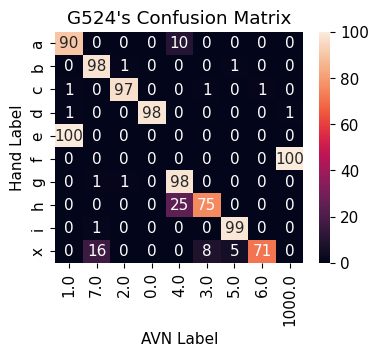

In [29]:
temp_df = pd.DataFrame({"hand_labels": all_matches.hand_label, 
                          "clusters": all_matches.hdbscan_labels})
conf_mat = pd.crosstab(temp_df.hand_labels, temp_df.clusters)
conf_mat = conf_mat.div(conf_mat.sum(axis = 1), axis = 0) * 100
conf_mat = conf_mat[[1.0, 7.0, 2.0, 0.0, 4.0, 3.0, 5.0, 6.0, 1000.0]]
plt.figure(figsize = (4, 3))
sns.heatmap(conf_mat, annot = True, fmt='.0f')
plt.ylabel('Hand Label')
plt.xlabel('AVN Label')
plt.title("G524's Confusion Matrix")

([], [])

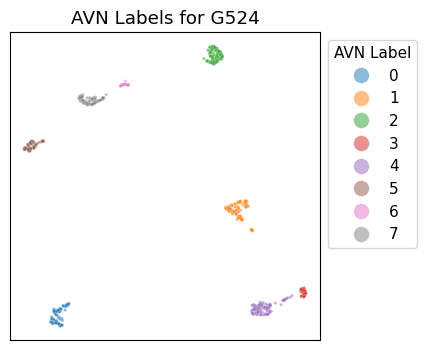

In [28]:
plt.figure(figsize = (4, 4))
sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 5, alpha = 0.5, legend = True)
plt.title('AVN Labels for G524')
plt.legend(title = 'AVN Label', bbox_to_anchor = (1, 1), markerscale = 5)
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])

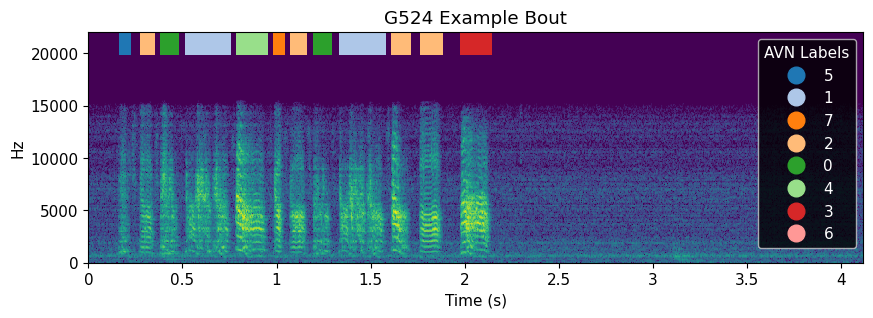

<Figure size 2000x500 with 0 Axes>

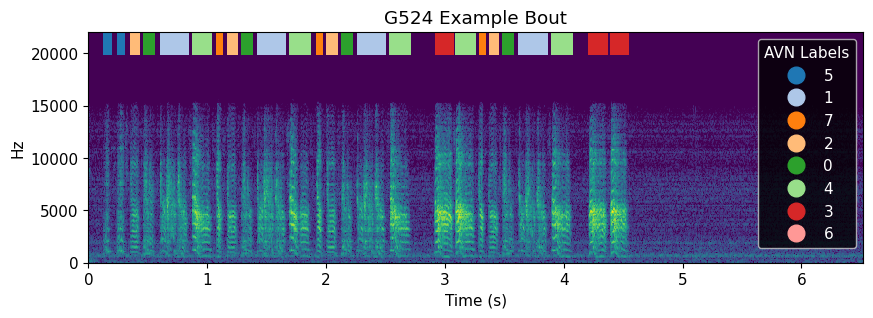

<Figure size 2000x500 with 0 Axes>

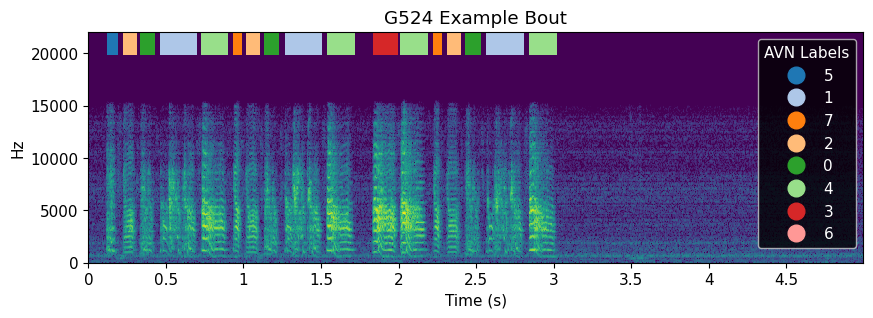

<Figure size 2000x500 with 0 Axes>

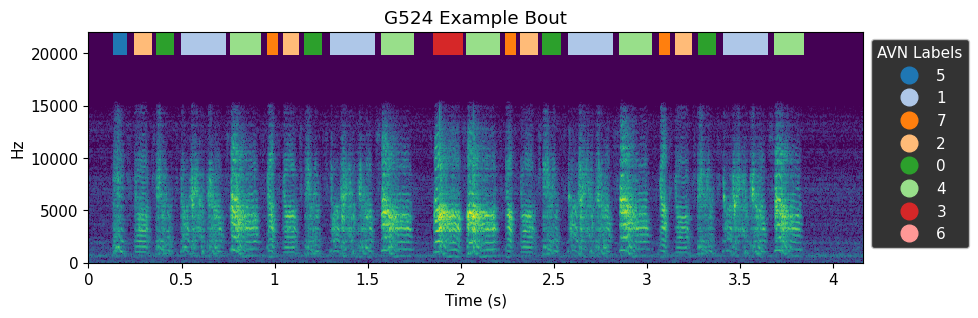

<Figure size 2000x500 with 0 Axes>

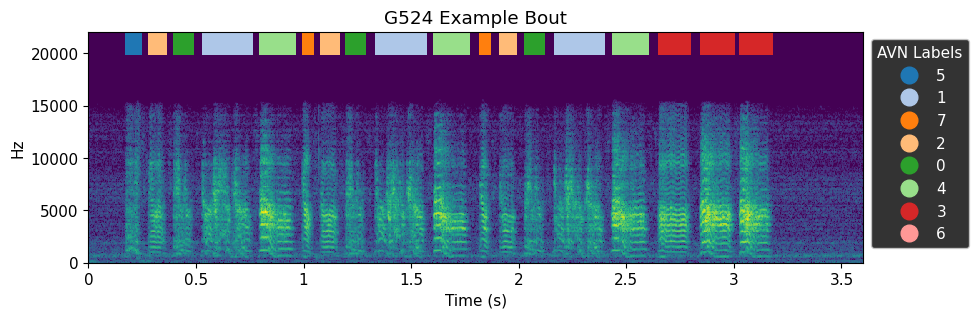

<Figure size 2000x500 with 0 Axes>

In [27]:
syll_df = pd.read_csv("E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" ) 

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" 

for i in range(5, 10):
        plot_spectrogram_with_labels(syll_df = syll_df, 
                                          song_folder_path = song_folder_path , 
                                          Bird_ID= Bird_ID, song_file_index=i, figsize = (10, 3), fontsize = 11, title = 'G524 Example Bout')

## O421

O421


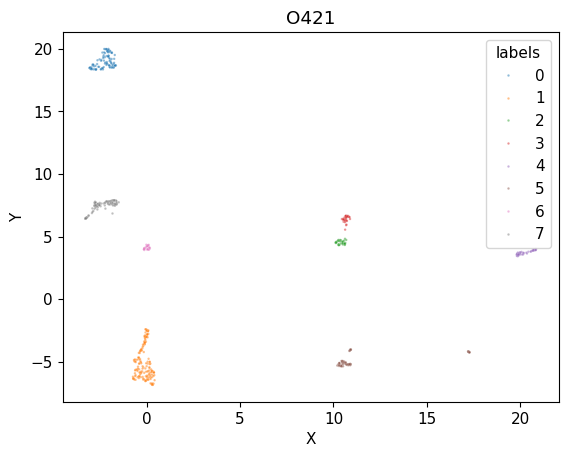

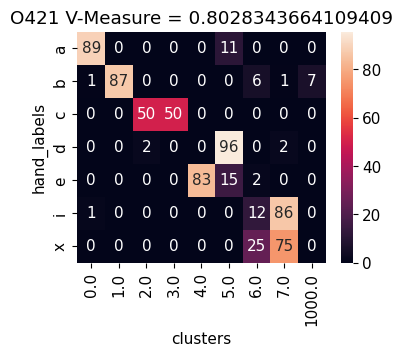

In [18]:
Bird_ID = 'O421'

print(Bird_ID)
segmentations_path = "E:\\Final_Bird_Dataset\\WhisperSeg_Segmentation_labeled\\" + Bird_ID + "_wseg.csv"

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" + Bird_ID + "\\"

output_file = "E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" 

#load segmentations
segmentations = pd.read_csv(segmentations_path)

#load segmentations
segmentations = pd.read_csv(segmentations_path).drop(columns= ['Unnamed: 0'])

segmentations = segmentations.rename(columns = {'onset' : 'onsets', 
                                            'offset' : 'offsets',
                                            'file' : 'files'})

#Add syllable audio to dataframe
syllable_dfs = pd.DataFrame()
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for song_file in segmentations.files.unique():
        file_path = song_folder_path + song_file
        song = avn.dataloading.SongFile(file_path)
        song.bandpass_filter(500, 15000)

        syllable_df = segmentations[segmentations['files'] == song_file]

        #this section is based on avgn.signalprocessing.create_spectrogram_dataset.get_row_audio()
        syllable_df["audio"] = [song.data[int(st * song.sample_rate) : int(et * song.sample_rate)]
                                for st, et in zip(syllable_df.onsets.values, syllable_df.offsets.values)]
        syllable_dfs = pd.concat([syllable_dfs, syllable_df])
    #Normalize the audio
    syllable_dfs['audio'] = [librosa.util.normalize(i) for i in syllable_dfs.audio.values]
    #compute spectrogram for each syllable
    syllables_spec = []

    for syllable in syllable_dfs.audio.values:
        
        syllable_spec = make_spec(syllable, 
                                    hop_length = hop_length, 
                                    win_length = win_length, 
                                    n_fft = n_fft, 
                                    ref_db = ref_db, 
                                    amin = amin, 
                                    min_level_db = min_level_db)
        if syllable_spec.shape[1] > 300:
            print("Long Syllable Corrections! Spectrogram Duration = " + str(syllable_spec.shape[1]))
            syllable_spec = syllable_spec[:, :300]

        syllables_spec.append(syllable_spec)
        
    #normalize spectrograms
    def norm(x):
        return (x - np.min(x)) / (np.max(x) - np.min(x))

    syllables_spec_norm = [norm(i) for i in syllables_spec]
    #Pad spectrograms for uniform dimensions
    spec_lens = [np.shape(i)[1] for i in syllables_spec]
    pad_length = np.max(spec_lens)


    syllables_spec_padded = []

    for spec in syllables_spec_norm:
        to_add = pad_length - np.shape(spec)[1]
        pad_left = np.floor(float(to_add) / 2).astype("int")
        pad_right = np.ceil(float(to_add) / 2).astype("int")
        spec_padded = np.pad(spec, [(0, 0), (pad_left, pad_right)], 'constant', constant_values = 0)
        syllables_spec_padded.append(spec_padded)
        
    #flatten the spectrograms into 1D
    specs_flattened = [spec.flatten() for spec in syllables_spec_padded]
    specs_flattened_array = np.array(specs_flattened)

    #Embed
    embedding = umap.UMAP(min_dist = 0.0, random_state = 42).fit_transform(specs_flattened_array)

    #cluster
    min_cluster_size = math.floor(embedding.shape[0] * min_cluster_prop)
    clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, core_dist_n_jobs=1, min_samples = 5).fit(embedding)

hdbscan_df = syllable_dfs
hdbscan_df["labels"] = clusterer.labels_
hdbscan_df["X"] = embedding[:, 0]
hdbscan_df["Y"] = embedding[:, 1]
hdbscan_df['hdbscan_labels'] = hdbscan_df.labels
hdbscan_df["labels"] = hdbscan_df['labels'].astype("category")

hdbscan_df.to_csv(output_file)

sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 3, alpha = 0.5)
plt.title(Bird_ID)
plt.show()

#load ground truth labels
hand_label_df_path = "C:/Grad_School/Code_and_software/Py_code/March_2021_redo/redo_data/labeled_songs/" + Bird_ID + "/" + Bird_ID + "_syll_df_evsonganaly.csv"
hand_label_df = pd.read_csv(hand_label_df_path)
hand_label_df = clean_syll_table(hand_label_df)

#align tweetynet syllables with ground truth syllables
all_matches = merge_hdbscan_hand_dfs(hdbscan_df, hand_label_df)
all_matches = remove_nas_from_merge(all_matches)

tweetynet_sylls = all_matches[all_matches.hdbscan_labels != 1000]


#claculate v-measure
v_measure = sklearn.metrics.v_measure_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
completeness = sklearn.metrics.completeness_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
homogeneity = sklearn.metrics.homogeneity_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)

curr_v_measure = pd.DataFrame({"v_measure" : [v_measure], 
                                "homogeneity" : [homogeneity], 
                                "completeness" : [completeness],
                                    "Bird_ID" : Bird_ID, 
                                    "ref_db": ref_db, 
                                    "win_length" : win_length,
                                    "hop_length" : hop_length, 
                                    "n_fft" : n_fft, 
                                    "K_nn" : K, 
                                    "min_cluster_prop" : min_cluster_prop, 
                                    "embedding_method" : "UMAP", 
                                    "embedding_dimensions" : embedding_dim, 
                                    "min_level_db" : min_level_db})

#all_v_measures = pd.concat([all_v_measures, curr_v_measure])
#plot confusion matrix
plot_confusion_matrix(all_matches)
plt.title(Bird_ID + " V-Measure = " + str(v_measure))
plt.show()

In [19]:
len(hdbscan_df)

574

Text(0.5, 1.0, "O421's Confusion Matrix")

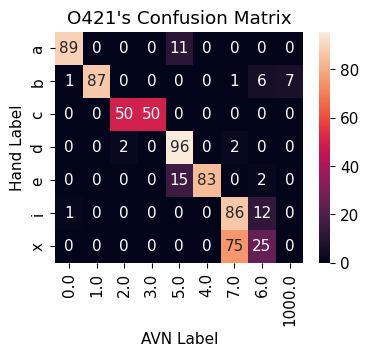

In [33]:
temp_df = pd.DataFrame({"hand_labels": all_matches.hand_label, 
                          "clusters": all_matches.hdbscan_labels})
conf_mat = pd.crosstab(temp_df.hand_labels, temp_df.clusters)
conf_mat = conf_mat.div(conf_mat.sum(axis = 1), axis = 0) * 100
conf_mat = conf_mat[[0.0, 1.0, 2.0, 3.0, 5.0, 4.0, 7.0, 6.0, 1000.0]]
plt.figure(figsize = (4, 3))
sns.heatmap(conf_mat, annot = True, fmt='.0f')
plt.ylabel('Hand Label')
plt.xlabel('AVN Label')
plt.title("O421's Confusion Matrix")

([], [])

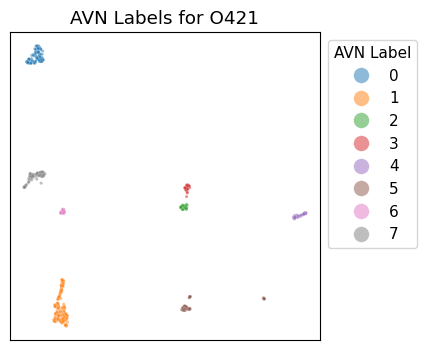

In [34]:
plt.figure(figsize = (4, 4))
sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 5, alpha = 0.5, legend = True)
plt.title('AVN Labels for O421')
plt.legend(title = 'AVN Label', bbox_to_anchor = (1, 1), markerscale = 5)
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])

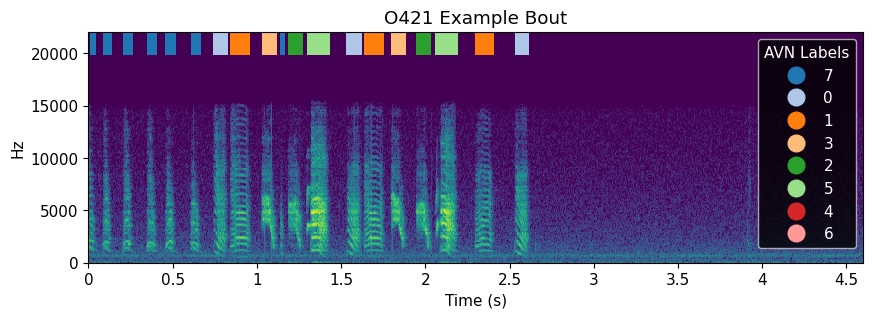

<Figure size 2000x500 with 0 Axes>

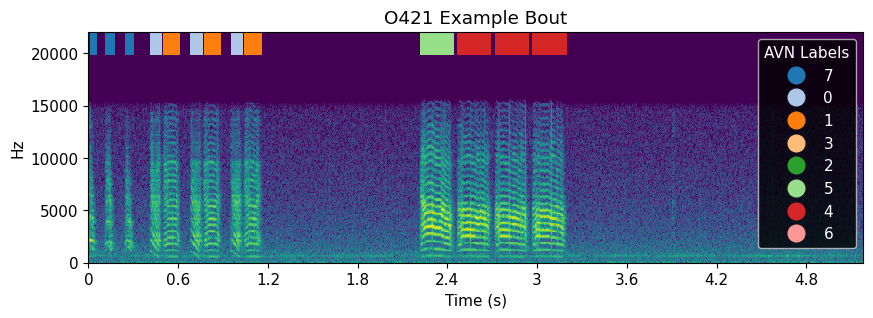

<Figure size 2000x500 with 0 Axes>

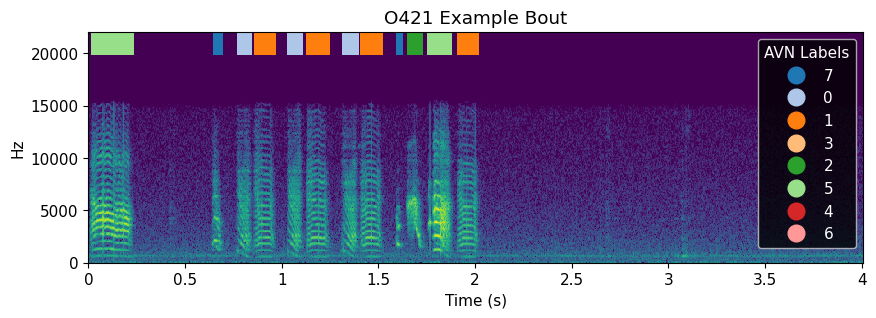

<Figure size 2000x500 with 0 Axes>

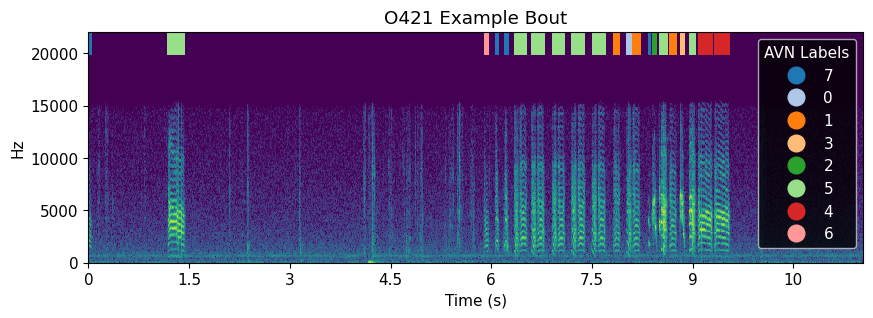

<Figure size 2000x500 with 0 Axes>

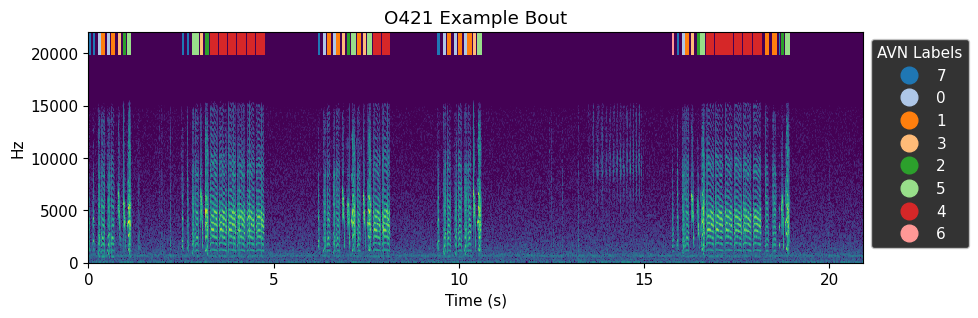

<Figure size 2000x500 with 0 Axes>

In [36]:
syll_df = pd.read_csv("E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" ) 

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" 

for i in range(0, 5):
        plot_spectrogram_with_labels(syll_df = syll_df, 
                                          song_folder_path = song_folder_path , 
                                          Bird_ID= Bird_ID, song_file_index=i, figsize = (10, 3), fontsize = 11, title = 'O421 Example Bout')

## Y440

Y440


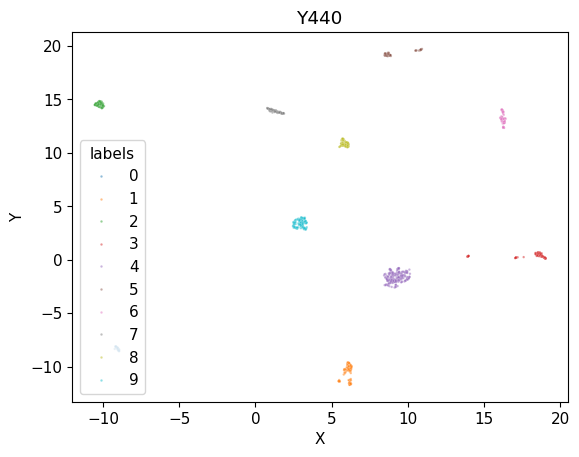

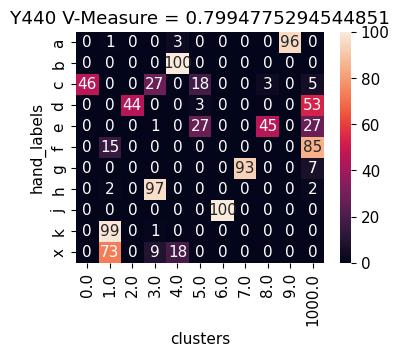

In [43]:
Bird_ID = 'Y440'

print(Bird_ID)
segmentations_path = "E:\\Final_Bird_Dataset\\WhisperSeg_Segmentation_labeled\\" + Bird_ID + "_wseg.csv"

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" + Bird_ID + "\\"

output_file = "E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" 

#load segmentations
segmentations = pd.read_csv(segmentations_path)

#load segmentations
segmentations = pd.read_csv(segmentations_path).drop(columns= ['Unnamed: 0'])

segmentations = segmentations.rename(columns = {'onset' : 'onsets', 
                                            'offset' : 'offsets',
                                            'file' : 'files'})

#Add syllable audio to dataframe
syllable_dfs = pd.DataFrame()
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for song_file in segmentations.files.unique():
        file_path = song_folder_path + song_file
        song = avn.dataloading.SongFile(file_path)
        song.bandpass_filter(500, 15000)

        syllable_df = segmentations[segmentations['files'] == song_file]

        #this section is based on avgn.signalprocessing.create_spectrogram_dataset.get_row_audio()
        syllable_df["audio"] = [song.data[int(st * song.sample_rate) : int(et * song.sample_rate)]
                                for st, et in zip(syllable_df.onsets.values, syllable_df.offsets.values)]
        syllable_dfs = pd.concat([syllable_dfs, syllable_df])
    #Normalize the audio
    syllable_dfs['audio'] = [librosa.util.normalize(i) for i in syllable_dfs.audio.values]
    #compute spectrogram for each syllable
    syllables_spec = []

    for syllable in syllable_dfs.audio.values:
        
        syllable_spec = make_spec(syllable, 
                                    hop_length = hop_length, 
                                    win_length = win_length, 
                                    n_fft = n_fft, 
                                    ref_db = ref_db, 
                                    amin = amin, 
                                    min_level_db = min_level_db)
        if syllable_spec.shape[1] > 300:
            print("Long Syllable Corrections! Spectrogram Duration = " + str(syllable_spec.shape[1]))
            syllable_spec = syllable_spec[:, :300]

        syllables_spec.append(syllable_spec)
        
    #normalize spectrograms
    def norm(x):
        return (x - np.min(x)) / (np.max(x) - np.min(x))

    syllables_spec_norm = [norm(i) for i in syllables_spec]
    #Pad spectrograms for uniform dimensions
    spec_lens = [np.shape(i)[1] for i in syllables_spec]
    pad_length = np.max(spec_lens)


    syllables_spec_padded = []

    for spec in syllables_spec_norm:
        to_add = pad_length - np.shape(spec)[1]
        pad_left = np.floor(float(to_add) / 2).astype("int")
        pad_right = np.ceil(float(to_add) / 2).astype("int")
        spec_padded = np.pad(spec, [(0, 0), (pad_left, pad_right)], 'constant', constant_values = 0)
        syllables_spec_padded.append(spec_padded)
        
    #flatten the spectrograms into 1D
    specs_flattened = [spec.flatten() for spec in syllables_spec_padded]
    specs_flattened_array = np.array(specs_flattened)

    #Embed
    embedding = umap.UMAP(min_dist = 0.0, random_state = 42).fit_transform(specs_flattened_array)

    #cluster
    min_cluster_size = math.floor(embedding.shape[0] * min_cluster_prop)
    clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, core_dist_n_jobs=1, min_samples = 5).fit(embedding)

hdbscan_df = syllable_dfs
hdbscan_df["labels"] = clusterer.labels_
hdbscan_df["X"] = embedding[:, 0]
hdbscan_df["Y"] = embedding[:, 1]
hdbscan_df['hdbscan_labels'] = hdbscan_df.labels
hdbscan_df["labels"] = hdbscan_df['labels'].astype("category")

hdbscan_df.to_csv(output_file)

sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 3, alpha = 0.5)
plt.title(Bird_ID)
plt.show()

#load ground truth labels
hand_label_df_path = "C:/Grad_School/Code_and_software/Py_code/March_2021_redo/redo_data/labeled_songs/" + Bird_ID + "/" + Bird_ID + "_syll_df_evsonganaly.csv"
hand_label_df = pd.read_csv(hand_label_df_path)
hand_label_df = clean_syll_table(hand_label_df)

#align tweetynet syllables with ground truth syllables
all_matches = merge_hdbscan_hand_dfs(hdbscan_df, hand_label_df)
all_matches = remove_nas_from_merge(all_matches)

tweetynet_sylls = all_matches[all_matches.hdbscan_labels != 1000]


#claculate v-measure
v_measure = sklearn.metrics.v_measure_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
completeness = sklearn.metrics.completeness_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
homogeneity = sklearn.metrics.homogeneity_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)

curr_v_measure = pd.DataFrame({"v_measure" : [v_measure], 
                                "homogeneity" : [homogeneity], 
                                "completeness" : [completeness],
                                    "Bird_ID" : Bird_ID, 
                                    "ref_db": ref_db, 
                                    "win_length" : win_length,
                                    "hop_length" : hop_length, 
                                    "n_fft" : n_fft, 
                                    "K_nn" : K, 
                                    "min_cluster_prop" : min_cluster_prop, 
                                    "embedding_method" : "UMAP", 
                                    "embedding_dimensions" : embedding_dim, 
                                    "min_level_db" : min_level_db})

all_v_measures = pd.concat([all_v_measures, curr_v_measure])
#plot confusion matrix
plot_confusion_matrix(all_matches)
plt.title(Bird_ID + " V-Measure = " + str(v_measure))
plt.show()

Text(0.5, 1.0, "Y440's Confusion Matrix")

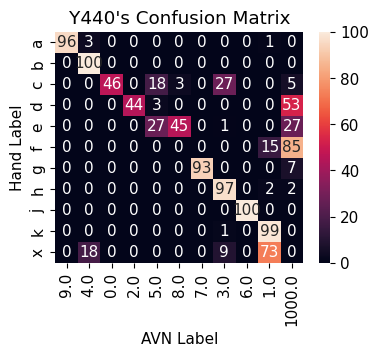

In [44]:
temp_df = pd.DataFrame({"hand_labels": all_matches.hand_label, 
                          "clusters": all_matches.hdbscan_labels})
conf_mat = pd.crosstab(temp_df.hand_labels, temp_df.clusters)
conf_mat = conf_mat.div(conf_mat.sum(axis = 1), axis = 0) * 100
conf_mat = conf_mat[[9.0, 4.0, 0.0, 2.0, 5, 8, 7, 3, 6, 1, 1000]]
plt.figure(figsize = (4, 3))
sns.heatmap(conf_mat, annot = True, fmt='.0f')
plt.ylabel('Hand Label')
plt.xlabel('AVN Label')
plt.title("Y440's Confusion Matrix")

([], [])

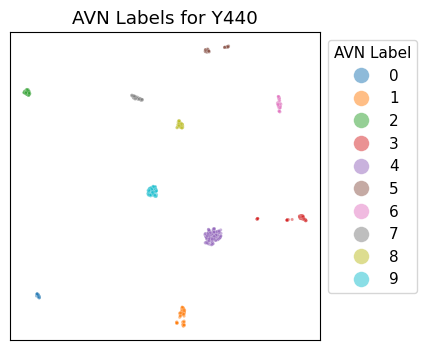

In [45]:
plt.figure(figsize = (4, 4))
sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 5, alpha = 0.5, legend = True)
plt.title('AVN Labels for Y440')
plt.legend(title = 'AVN Label', bbox_to_anchor = (1, 1), markerscale = 5)
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])

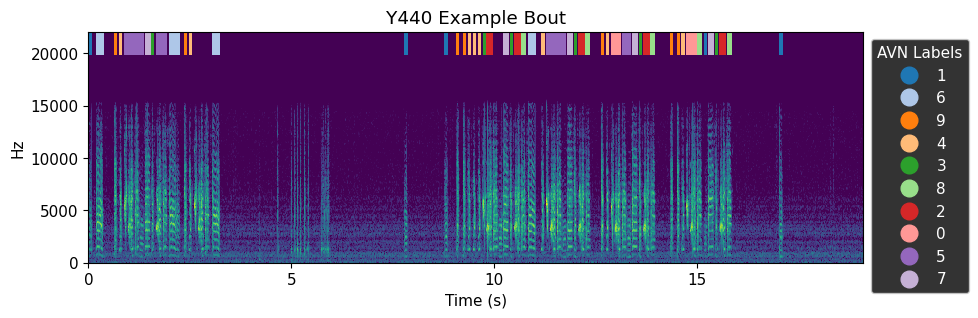

<Figure size 2000x500 with 0 Axes>

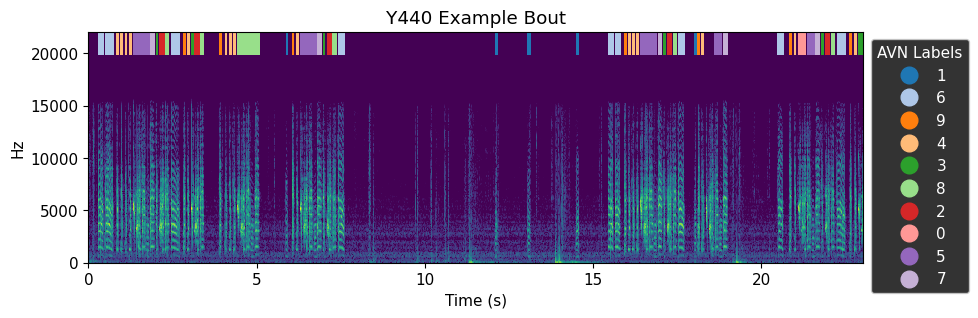

<Figure size 2000x500 with 0 Axes>

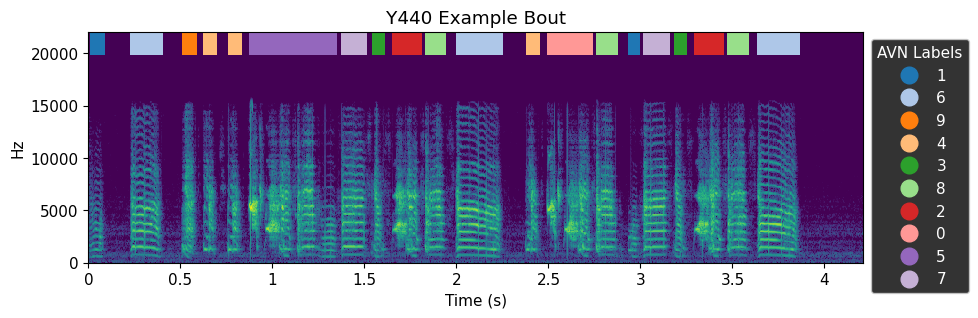

<Figure size 2000x500 with 0 Axes>

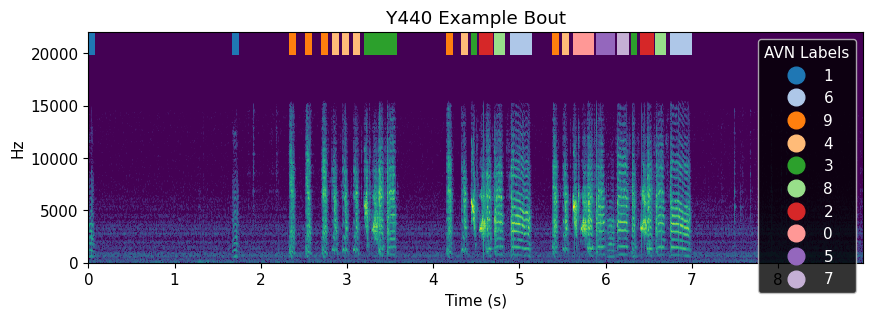

<Figure size 2000x500 with 0 Axes>

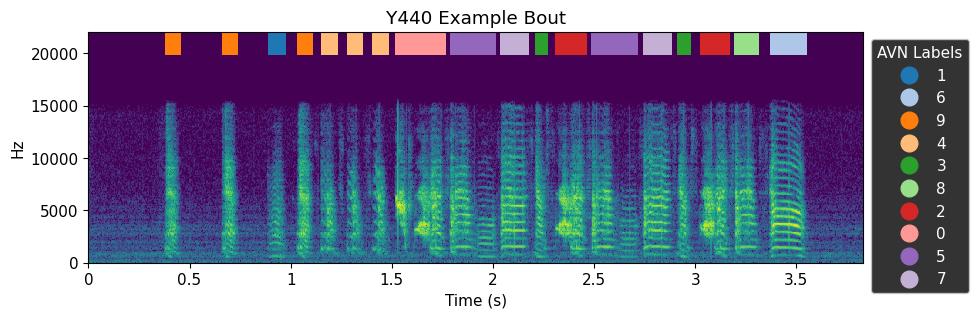

<Figure size 2000x500 with 0 Axes>

In [46]:
syll_df = pd.read_csv("E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" ) 

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" 

for i in range(10, 15):
        plot_spectrogram_with_labels(syll_df = syll_df, 
                                          song_folder_path = song_folder_path , 
                                          Bird_ID= Bird_ID, song_file_index=i, figsize = (10, 3), fontsize = 11, title = 'Y440 Example Bout')

## O440

O440


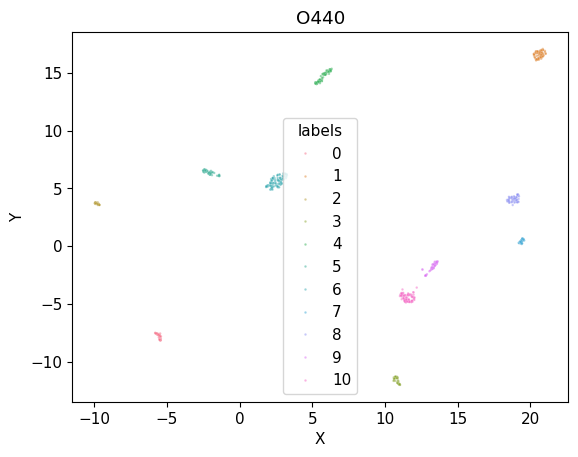

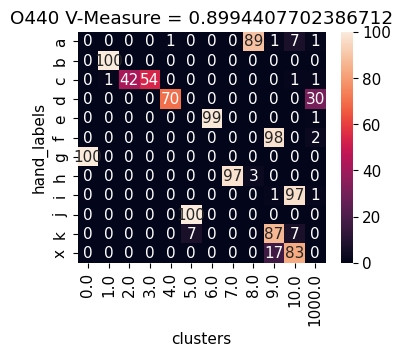

In [20]:
Bird_ID = 'O440'

print(Bird_ID)
segmentations_path = "E:\\Final_Bird_Dataset\\WhisperSeg_Segmentation_labeled\\" + Bird_ID + "_wseg.csv"

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" + Bird_ID + "\\"

output_file = "E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" 

#load segmentations
segmentations = pd.read_csv(segmentations_path)

#load segmentations
segmentations = pd.read_csv(segmentations_path).drop(columns= ['Unnamed: 0'])

segmentations = segmentations.rename(columns = {'onset' : 'onsets', 
                                            'offset' : 'offsets',
                                            'file' : 'files'})

#Add syllable audio to dataframe
syllable_dfs = pd.DataFrame()
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for song_file in segmentations.files.unique():
        file_path = song_folder_path + song_file
        song = avn.dataloading.SongFile(file_path)
        song.bandpass_filter(500, 15000)

        syllable_df = segmentations[segmentations['files'] == song_file]

        #this section is based on avgn.signalprocessing.create_spectrogram_dataset.get_row_audio()
        syllable_df["audio"] = [song.data[int(st * song.sample_rate) : int(et * song.sample_rate)]
                                for st, et in zip(syllable_df.onsets.values, syllable_df.offsets.values)]
        syllable_dfs = pd.concat([syllable_dfs, syllable_df])
    #Normalize the audio
    syllable_dfs['audio'] = [librosa.util.normalize(i) for i in syllable_dfs.audio.values]
    #compute spectrogram for each syllable
    syllables_spec = []

    for syllable in syllable_dfs.audio.values:
        
        syllable_spec = make_spec(syllable, 
                                    hop_length = hop_length, 
                                    win_length = win_length, 
                                    n_fft = n_fft, 
                                    ref_db = ref_db, 
                                    amin = amin, 
                                    min_level_db = min_level_db)
        if syllable_spec.shape[1] > 300:
            print("Long Syllable Corrections! Spectrogram Duration = " + str(syllable_spec.shape[1]))
            syllable_spec = syllable_spec[:, :300]

        syllables_spec.append(syllable_spec)
        
    #normalize spectrograms
    def norm(x):
        return (x - np.min(x)) / (np.max(x) - np.min(x))

    syllables_spec_norm = [norm(i) for i in syllables_spec]
    #Pad spectrograms for uniform dimensions
    spec_lens = [np.shape(i)[1] for i in syllables_spec]
    pad_length = np.max(spec_lens)


    syllables_spec_padded = []

    for spec in syllables_spec_norm:
        to_add = pad_length - np.shape(spec)[1]
        pad_left = np.floor(float(to_add) / 2).astype("int")
        pad_right = np.ceil(float(to_add) / 2).astype("int")
        spec_padded = np.pad(spec, [(0, 0), (pad_left, pad_right)], 'constant', constant_values = 0)
        syllables_spec_padded.append(spec_padded)
        
    #flatten the spectrograms into 1D
    specs_flattened = [spec.flatten() for spec in syllables_spec_padded]
    specs_flattened_array = np.array(specs_flattened)

    #Embed
    embedding = umap.UMAP(min_dist = 0.0, random_state = 42).fit_transform(specs_flattened_array)

    #cluster
    min_cluster_size = math.floor(embedding.shape[0] * min_cluster_prop)
    clusterer = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size, core_dist_n_jobs=1, min_samples = 5).fit(embedding)

hdbscan_df = syllable_dfs
hdbscan_df["labels"] = clusterer.labels_
hdbscan_df["X"] = embedding[:, 0]
hdbscan_df["Y"] = embedding[:, 1]
hdbscan_df['hdbscan_labels'] = hdbscan_df.labels
hdbscan_df["labels"] = hdbscan_df['labels'].astype("category")

hdbscan_df.to_csv(output_file)

sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 3, alpha = 0.5)
plt.title(Bird_ID)
plt.show()

#load ground truth labels
hand_label_df_path = "C:/Grad_School/Code_and_software/Py_code/March_2021_redo/redo_data/labeled_songs/" + Bird_ID + "/" + Bird_ID + "_syll_df_evsonganaly.csv"
hand_label_df = pd.read_csv(hand_label_df_path)
hand_label_df = clean_syll_table(hand_label_df)

#align tweetynet syllables with ground truth syllables
all_matches = merge_hdbscan_hand_dfs(hdbscan_df, hand_label_df)
all_matches = remove_nas_from_merge(all_matches)

tweetynet_sylls = all_matches[all_matches.hdbscan_labels != 1000]


#claculate v-measure
v_measure = sklearn.metrics.v_measure_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
completeness = sklearn.metrics.completeness_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)
homogeneity = sklearn.metrics.homogeneity_score(labels_true = all_matches.hand_label, 
                                            labels_pred = all_matches.hdbscan_labels)

curr_v_measure = pd.DataFrame({"v_measure" : [v_measure], 
                                "homogeneity" : [homogeneity], 
                                "completeness" : [completeness],
                                    "Bird_ID" : Bird_ID, 
                                    "ref_db": ref_db, 
                                    "win_length" : win_length,
                                    "hop_length" : hop_length, 
                                    "n_fft" : n_fft, 
                                    "K_nn" : K, 
                                    "min_cluster_prop" : min_cluster_prop, 
                                    "embedding_method" : "UMAP", 
                                    "embedding_dimensions" : embedding_dim, 
                                    "min_level_db" : min_level_db})

#all_v_measures = pd.concat([all_v_measures, curr_v_measure])
#plot confusion matrix
plot_confusion_matrix(all_matches)
plt.title(Bird_ID + " V-Measure = " + str(v_measure))
plt.show()

In [21]:
len(hdbscan_df)

683

Text(0.5, 1.0, "O440's Confusion Matrix")

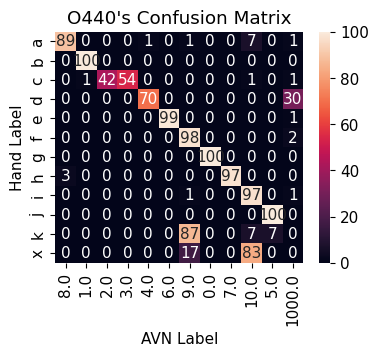

In [ ]:
temp_df = pd.DataFrame({"hand_labels": all_matches.hand_label, 
                          "clusters": all_matches.hdbscan_labels})
conf_mat = pd.crosstab(temp_df.hand_labels, temp_df.clusters)
conf_mat = conf_mat.div(conf_mat.sum(axis = 1), axis = 0) * 100
conf_mat = conf_mat[[8.0, 1.0, 2.0, 3.0, 4.0, 6.0, 9.0, 0.0, 7.0, 10.0, 5.0, 1000.0]]
plt.figure(figsize = (4, 3))
sns.heatmap(conf_mat, annot = True, fmt='.0f')
plt.ylabel('Hand Label')
plt.xlabel('AVN Label')
plt.title("O440's Confusion Matrix")

([], [])

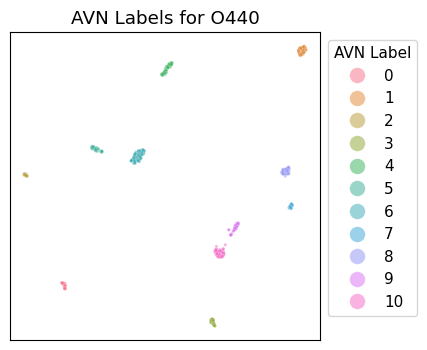

In [ ]:
plt.figure(figsize = (4, 4))
sns.scatterplot(data = hdbscan_df,  x = 'X', y = 'Y', hue  =  'labels', s = 5, alpha = 0.5, legend = True)
plt.title('AVN Labels for O440')
plt.legend(title = 'AVN Label', bbox_to_anchor = (1, 1), markerscale = 5)
plt.xlabel('')
plt.xticks([])
plt.ylabel('')
plt.yticks([])

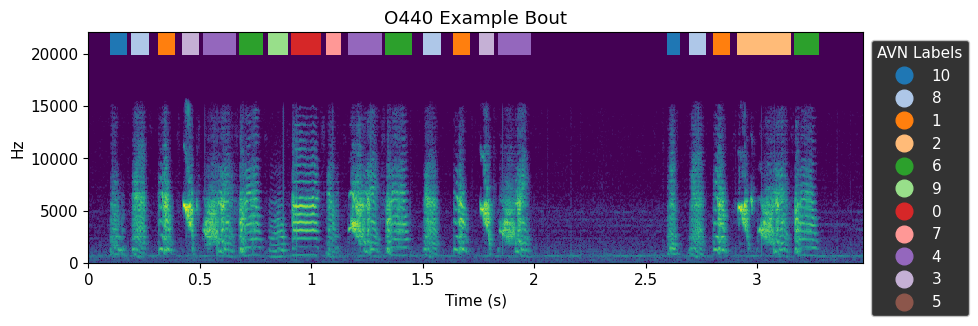

<Figure size 2000x500 with 0 Axes>

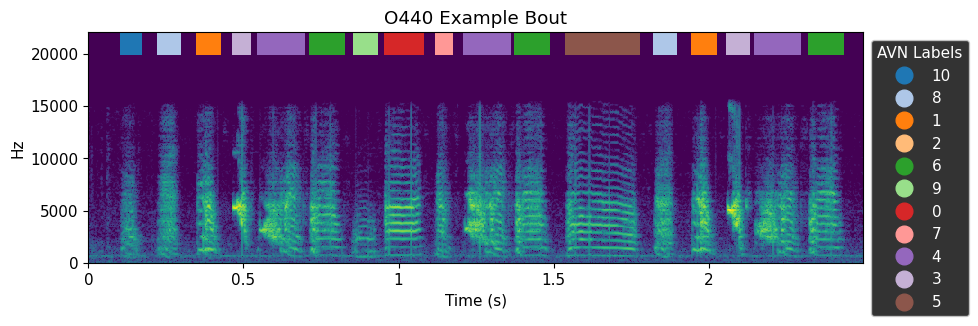

<Figure size 2000x500 with 0 Axes>

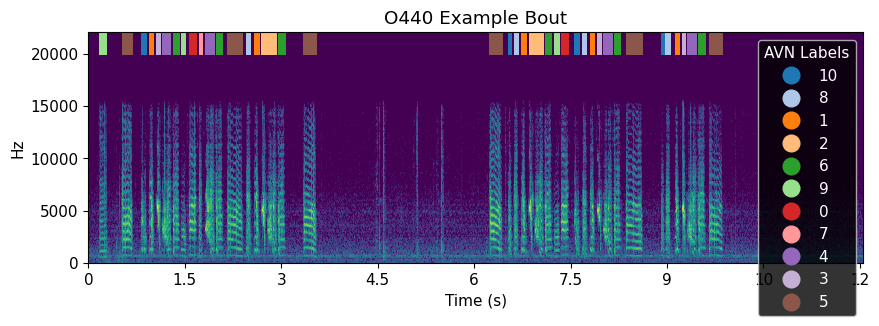

<Figure size 2000x500 with 0 Axes>

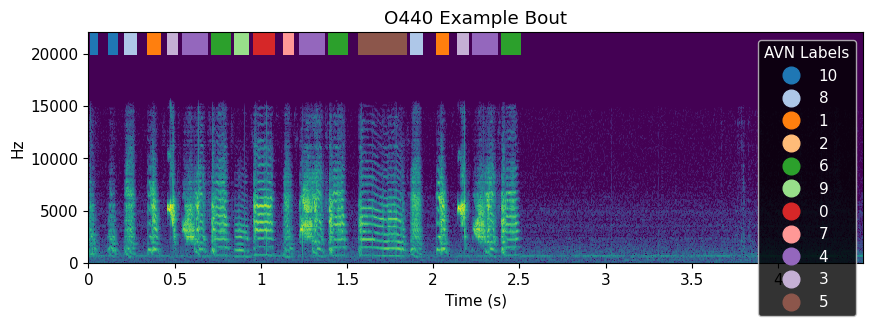

<Figure size 2000x500 with 0 Axes>

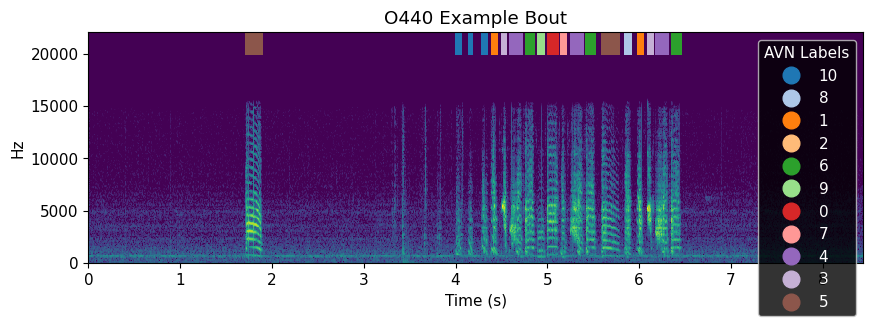

<Figure size 2000x500 with 0 Axes>

In [ ]:
syll_df = pd.read_csv("E:\\Final_Bird_Dataset\\UMAP_WSeg_labels_updated\\" + Bird_ID + "_labels.csv" ) 

song_folder_path = "E:\\Final_Bird_Dataset\\FP1_project_birds\\labeled_songs\\" 

for i in range(10, 15):
        plot_spectrogram_with_labels(syll_df = syll_df, 
                                          song_folder_path = song_folder_path , 
                                          Bird_ID= Bird_ID, song_file_index=i, figsize = (10, 3), fontsize = 11, title = 'O440 Example Bout')